
ALL PARTICLE VALUES
[([-334.31049560387083, -117.06722691264088], 543.5962204092765), ([78.8758306206943, -41.17914397728981], 802.6694788596477), ([211.81348298791397, 334.98807821589173], 818.4737706989438), ([-243.328910355145, 12.385703577708739], 868.9945363797224), ([-21.441648976175998, -203.97080499932133], 1018.4360743802108)]

Best Position:
[-334.31049560387083, -117.06722691264088]

Best Value:
543.5962204092765

ALL PARTICLE VALUES
[([220.5951555417139, 353.35911369357035], 689.6993676026309), ([165.89869052291985, -21.77522427004841], 765.0054192148115), ([45.794565416703065, -60.477471305308455], 876.9542926785181), ([257.3743418220684, 116.32256996314844], 1036.3251803402463), ([-160.88966241930595, 288.468385731392], 1132.9413402842006)]

Best Position:
[220.5951555417139, 353.35911369357035]

Best Value:
689.6993676026309

ALL PARTICLE VALUES
[([380.68086272576784, 193.81958865884377], 414.7699510634999), ([-27.28825701387231, 388.3382892725572], 520.696186679186), (

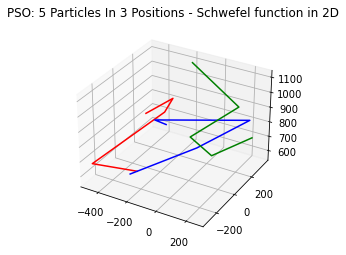

In [58]:
#the intial framework for a particle swarm optimization for Schwefel minimization problem
#author: Charles Nicholson
#for ISE/DSA 5113


#need some python libraries
import copy
import math
from random import Random


#to setup a random number generator, we will specify a "seed" value
seed = 51132021
myPRNG = Random(seed)

#to get a random number between 0 and 1, write call this:             myPRNG.random()
#to get a random number between lwrBnd and upprBnd, write call this:  myPRNG.uniform(lwrBnd,upprBnd)
#to get a random integer between lwrBnd and upprBnd, write call this: myPRNG.randint(lwrBnd,upprBnd)

lowerBound = -500  #bounds for Schwefel Function search space
upperBound = 500   #bounds for Schwefel Function search space

#you may change anything below this line that you wish too -----------------------------------------------------

#note: for the more experienced Python programmers, you might want to consider taking a more object-oriented approach to the PSO implementation, i.e.: a particle class with methods to initialize itself, and update its own velocity and position; a swarm class with a method to iterates through all particles to call update functions, etc.

#number of dimensions of problem
dimensions = 2

#number of particles in swarm
swarmSize = 5

      
#Schwefel function to evaluate a real-valued solution x    
# note: the feasible space is an n-dimensional hypercube centered at the origin with side length = 2 * 500

#function to evaluate the Schwefel Function for d dimensions
def evaluate(x):  
    val = 0
    d = len(x)
    for i in range(0,d):
        val = val + x[i]*math.sin(math.sqrt(abs(x[i])))
         
    val = 418.9829*d - val         
                    
    return val              

#the swarm will be represented as a list of positions, velocities, values, pbest, and pbest values

#pos = [[] for _ in range(swarmSize)]      #position of particles -- will be a list of lists; e.g., for a 2D problem with 3 particles: [[17,4],[-100,2],[87,-1.2]]
#vel = [[] for _ in range(swarmSize)]      #velocity of particles -- will be a list of lists similar to the "pos" object 

#initialize position and velocity as empty list
pos = []
vel = []

#note: pos[0] and vel[0] provides the position and velocity of particle 0; pos[1] and vel[1] provides the position and velocity of particle 1; and so on. 


curValue = [] #evaluation value of current position  -- will be a list of real values; curValue[0] provides the evaluation of particle 0 in it's current position
pbest = []    #particles' best historical position -- will be a list of lists: pbest[0] provides the position of particle 0's best historical position
pbestVal = [] #value of pbest position  -- will be a list of real values: pbestBal[0] provides the value of particle 0's pbest location


#initialize the swarm randomly
for i in range(0,swarmSize):
    coordinates = [] #initialize/reset coordinates
    velCoordinates = [] #initialize/reset velocity 
    for j in range(dimensions):
        #create particle position on every dimension
        currCoordinate = myPRNG.uniform(lowerBound,upperBound)
        coordinates.append(currCoordinate)    #assign random value between lower and upper bounds
        
        #pick random velocity based on coordinate
        if currCoordinate < -250: #shift between 0 to +750
            velCoordinates.append(myPRNG.uniform(0, 750))
        elif currCoordinate < 0: #shift between 0 to +500
            velCoordinates.append(myPRNG.uniform(0, 500))
        elif currCoordinate < 250: #shift between 0 to -500
            velCoordinates.append(myPRNG.uniform(-500, 0))
        else: #shift between 0 to -750
            velCoordinates.append(myPRNG.uniform(-750, 0))
    
    #insert coordinates for current position to the list
    pos.append(coordinates[:])    
    #create velocity on every particle
    vel.append(velCoordinates)
    #insert the current value of the current position to the list
    curValue.append(evaluate(pos[i]))   #evaluate the current position

    #print("pos: ", pos[i])
    #print("current values:")
    #print(curValue[i])

#keep track of particle's points and its value    
tempZip = zip(pos, curValue)
particlesVals = sorted(tempZip, key=lambda tempZip: tempZip[1])

#initialize the pBest and pBestVal
pBest = particlesVals[0][0]          # initialize pbest to the starting position
pBestVal = particlesVals[0][1]  # initialize pbest to the starting position
#print("pBest:", pBest)
#print("pBestVal:", pBestVal)

#Currently missing several elements
#e.g., velocity update function; velocity max limitations; position updates; dealing with infeasible space; identifying the global best; main loop, stopping criterion, etc. 

def moveSwarm (particlesVals, vel):
    for i in range(0,swarmSize):
        newCoordinate = []
        for j in range(dimensions):
            #update position
            newCoordinate.append(pos[i][j] + vel[i][j])
        
        #update value
        newValue = evaluate(newCoordinate)
        pos[i] = newCoordinate[:]
        curValue[i] = newValue
    
    #update of particle's points and its value    
    tempZip = zip(pos, curValue)
    particlesVals = sorted(tempZip, key=lambda tempZip: tempZip[1])
    
    #update pBest and pBestVal
    pBest = particlesVals[0][0]
    pBestVal = particlesVals[0][1]
    
    print("\nALL PARTICLE VALUES")
    print(particlesVals)
    
    print("\nBest Position:")
    print(pBest)
    print("\nBest Value:")
    print(pBestVal)
    
    
    return particlesVals


def velUpdate(particlesVals, pBest, vel, iterationNum):
    vel = [] #reset velocity list
    for i in range(0,swarmSize):
        velCoordinates = [] #initialize/reset velocity 
        #newCoordinate = []
        minVel = -500
        maxVel = 500
        maxBestSol = 420.9687
        tempMin = 0
        tempMax = 0
        
        for j in range(dimensions):
            currCoordinate = pos[i][j]
            tempMin = pBest[j] - currCoordinate
            tempMax = maxBestSol - currCoordinate
            '''
            if tempMin < tempMax:
                minVel = tempMin
                maxVel = tempMax
            else:
                minVel = tempMax
                maxVel = tempMin
            '''
            #either on the left or right of global best of ~421
            if tempMax > 0:
                minVel = 0
                maxVel = tempMax
            else:
                minVel = tempMax
                maxVel = 0
                
            #pick random vel between minVel and maxVel
            newSeed = (i + j + seed)*100
            velSeed = Random(newSeed)
            velCoordinates.append(velSeed.uniform(minVel, maxVel))

        #create velocity on every particle
        vel.append(velCoordinates)
            
    return vel

import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

def plotParticles(particlesValues, velocity, numOfPositions):
    currParticlesVals = particlesValues[:]
    ax = plt.axes(projection ='3d')
    for i in range(0,numOfPositions):
        #take all point in population
        x = []
        y = []
        z = []

        for j in range(0,len(currParticlesVals)):
            x.append(currParticlesVals[j][0][0])
            y.append(currParticlesVals[j][0][1])
            z.append(currParticlesVals[j][1])
        x = np.array(x)
        y = np.array(y)
        z = np.array(z)
        cList = ['red', 'blue','green']
        
        currColor = cList[i]
        ax.plot3D(x, y, z, currColor)    
        
        #move swarm
        currParticlesVals = moveSwarm (currParticlesVals, velocity)
        #update velocity
        velocity = velUpdate(currParticlesVals, pBest, velocity, i)
    plt.title("PSO: 5 Particles In 3 Positions - Schwefel function in 2D")
    filename =  'PSO-' + str(numOfPositions) + '-Positions-Line-Schwefel-2D'  +'.png'
    plt.savefig(filename)
    plt.show()

#PLOT PARTICLES FOR 3 POSITIONS
plotParticles(particlesVals, vel, 3)



ALL PARTICLE VALUES
[([-334.31049560387083, -117.06722691264088], 543.5962204092765), ([78.8758306206943, -41.17914397728981], 802.6694788596477), ([211.81348298791397, 334.98807821589173], 818.4737706989438), ([-243.328910355145, 12.385703577708739], 868.9945363797224), ([-21.441648976175998, -203.97080499932133], 1018.4360743802108)]

Best Position:
[-334.31049560387083, -117.06722691264088]

Best Value:
543.5962204092765

ALL PARTICLE VALUES
[([220.5951555417139, 353.35911369357035], 689.6993676026309), ([165.89869052291985, -21.77522427004841], 765.0054192148115), ([45.794565416703065, -60.477471305308455], 876.9542926785181), ([257.3743418220684, 116.32256996314844], 1036.3251803402463), ([-160.88966241930595, 288.468385731392], 1132.9413402842006)]

Best Position:
[220.5951555417139, 353.35911369357035]

Best Value:
689.6993676026309

ALL PARTICLE VALUES
[([380.68086272576784, 193.81958865884377], 414.7699510634999), ([-27.28825701387231, 388.3382892725572], 520.696186679186), (

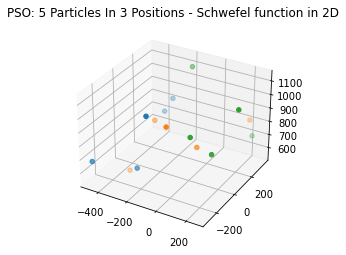

In [59]:
#the intial framework for a particle swarm optimization for Schwefel minimization problem
#author: Charles Nicholson
#for ISE/DSA 5113


#need some python libraries
import copy
import math
from random import Random


#to setup a random number generator, we will specify a "seed" value
seed = 51132021
myPRNG = Random(seed)

#to get a random number between 0 and 1, write call this:             myPRNG.random()
#to get a random number between lwrBnd and upprBnd, write call this:  myPRNG.uniform(lwrBnd,upprBnd)
#to get a random integer between lwrBnd and upprBnd, write call this: myPRNG.randint(lwrBnd,upprBnd)

lowerBound = -500  #bounds for Schwefel Function search space
upperBound = 500   #bounds for Schwefel Function search space

#you may change anything below this line that you wish too -----------------------------------------------------

#note: for the more experienced Python programmers, you might want to consider taking a more object-oriented approach to the PSO implementation, i.e.: a particle class with methods to initialize itself, and update its own velocity and position; a swarm class with a method to iterates through all particles to call update functions, etc.

#number of dimensions of problem
dimensions = 2

#number of particles in swarm
swarmSize = 5

      
#Schwefel function to evaluate a real-valued solution x    
# note: the feasible space is an n-dimensional hypercube centered at the origin with side length = 2 * 500

#function to evaluate the Schwefel Function for d dimensions
def evaluate(x):  
    val = 0
    d = len(x)
    for i in range(0,d):
        val = val + x[i]*math.sin(math.sqrt(abs(x[i])))
         
    val = 418.9829*d - val         
                    
    return val              

#the swarm will be represented as a list of positions, velocities, values, pbest, and pbest values

#pos = [[] for _ in range(swarmSize)]      #position of particles -- will be a list of lists; e.g., for a 2D problem with 3 particles: [[17,4],[-100,2],[87,-1.2]]
#vel = [[] for _ in range(swarmSize)]      #velocity of particles -- will be a list of lists similar to the "pos" object 

#initialize position and velocity as empty list
pos = []
vel = []

#note: pos[0] and vel[0] provides the position and velocity of particle 0; pos[1] and vel[1] provides the position and velocity of particle 1; and so on. 


curValue = [] #evaluation value of current position  -- will be a list of real values; curValue[0] provides the evaluation of particle 0 in it's current position
pbest = []    #particles' best historical position -- will be a list of lists: pbest[0] provides the position of particle 0's best historical position
pbestVal = [] #value of pbest position  -- will be a list of real values: pbestBal[0] provides the value of particle 0's pbest location


#initialize the swarm randomly
for i in range(0,swarmSize):
    coordinates = [] #initialize/reset coordinates
    velCoordinates = [] #initialize/reset velocity 
    for j in range(dimensions):
        #create particle position on every dimension
        currCoordinate = myPRNG.uniform(lowerBound,upperBound)
        coordinates.append(currCoordinate)    #assign random value between lower and upper bounds
        
        #pick random velocity based on coordinate
        if currCoordinate < -250: #shift between 0 to +750
            velCoordinates.append(myPRNG.uniform(0, 750))
        elif currCoordinate < 0: #shift between 0 to +500
            velCoordinates.append(myPRNG.uniform(0, 500))
        elif currCoordinate < 250: #shift between 0 to -500
            velCoordinates.append(myPRNG.uniform(-500, 0))
        else: #shift between 0 to -750
            velCoordinates.append(myPRNG.uniform(-750, 0))
    
    #insert coordinates for current position to the list
    pos.append(coordinates[:])    
    #create velocity on every particle
    vel.append(velCoordinates)
    #insert the current value of the current position to the list
    curValue.append(evaluate(pos[i]))   #evaluate the current position

    #print("pos: ", pos[i])
    #print("current values:")
    #print(curValue[i])

#keep track of particle's points and its value    
tempZip = zip(pos, curValue)
particlesVals = sorted(tempZip, key=lambda tempZip: tempZip[1])

#initialize the pBest and pBestVal
pBest = particlesVals[0][0]          # initialize pbest to the starting position
pBestVal = particlesVals[0][1]  # initialize pbest to the starting position
#print("pBest:", pBest)
#print("pBestVal:", pBestVal)

#Currently missing several elements
#e.g., velocity update function; velocity max limitations; position updates; dealing with infeasible space; identifying the global best; main loop, stopping criterion, etc. 

def moveSwarm (particlesVals, vel):
    for i in range(0,swarmSize):
        newCoordinate = []
        for j in range(dimensions):
            #update position
            newCoordinate.append(pos[i][j] + vel[i][j])
        
        #update value
        newValue = evaluate(newCoordinate)
        pos[i] = newCoordinate[:]
        curValue[i] = newValue
    
    #update of particle's points and its value    
    tempZip = zip(pos, curValue)
    particlesVals = sorted(tempZip, key=lambda tempZip: tempZip[1])
    
    #update pBest and pBestVal
    pBest = particlesVals[0][0]
    pBestVal = particlesVals[0][1]
    
    print("\nALL PARTICLE VALUES")
    print(particlesVals)
    
    print("\nBest Position:")
    print(pBest)
    print("\nBest Value:")
    print(pBestVal)
    
    
    return particlesVals


def velUpdate(particlesVals, pBest, vel, iterationNum):
    vel = [] #reset velocity list
    for i in range(0,swarmSize):
        velCoordinates = [] #initialize/reset velocity 
        #newCoordinate = []
        minVel = -500
        maxVel = 500
        maxBestSol = 420.9687
        tempMin = 0
        tempMax = 0
        
        for j in range(dimensions):
            currCoordinate = pos[i][j]
            tempMin = pBest[j] - currCoordinate
            tempMax = maxBestSol - currCoordinate
            '''
            if tempMin < tempMax:
                minVel = tempMin
                maxVel = tempMax
            else:
                minVel = tempMax
                maxVel = tempMin
            '''
            #either on the left or right of global best of ~421
            if tempMax > 0:
                minVel = 0
                maxVel = tempMax
            else:
                minVel = tempMax
                maxVel = 0
                
            #pick random vel between minVel and maxVel
            newSeed = (i + j + seed)*100
            velSeed = Random(newSeed)
            velCoordinates.append(velSeed.uniform(minVel, maxVel))

        #create velocity on every particle
        vel.append(velCoordinates)
            
    return vel


import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

def plotParticles(particlesValues, velocity, numOfPositions):
    currParticlesVals = particlesValues[:]
    ax = plt.axes(projection ='3d')
    for i in range(0,numOfPositions):
        #take all point in population
        x = []
        y = []
        z = []

        for j in range(0,len(currParticlesVals)):
            x.append(currParticlesVals[j][0][0])
            y.append(currParticlesVals[j][0][1])
            z.append(currParticlesVals[j][1])
        x = np.array(x)
        y = np.array(y)
        z = np.array(z)
        cList = ['red', 'blue','green']
        
        currColor = cList[i]
        ax.scatter(x, y, z, currColor)    
        
        #move swarm
        currParticlesVals = moveSwarm (currParticlesVals, velocity)
        #update velocity
        velocity = velUpdate(currParticlesVals, pBest, velocity, i)
    plt.title("PSO: 5 Particles In 3 Positions - Schwefel function in 2D")
    filename =  'PSO-' + str(numOfPositions) + '-Positions-Scatter-Schwefel-2D'  +'.png'
    plt.savefig(filename)
    plt.show()

#PLOT PARTICLES FOR 3 POSITIONS
plotParticles(particlesVals, vel, 3)


In [57]:
#the intial framework for a particle swarm optimization for Schwefel minimization problem
#author: Charles Nicholson
#for ISE/DSA 5113


#need some python libraries
import copy
import math
from random import Random


#to setup a random number generator, we will specify a "seed" value
seed = 51132021
myPRNG = Random(seed)

#to get a random number between 0 and 1, write call this:             myPRNG.random()
#to get a random number between lwrBnd and upprBnd, write call this:  myPRNG.uniform(lwrBnd,upprBnd)
#to get a random integer between lwrBnd and upprBnd, write call this: myPRNG.randint(lwrBnd,upprBnd)

lowerBound = -500  #bounds for Schwefel Function search space
upperBound = 500   #bounds for Schwefel Function search space

#you may change anything below this line that you wish too -----------------------------------------------------

#note: for the more experienced Python programmers, you might want to consider taking a more object-oriented approach to the PSO implementation, i.e.: a particle class with methods to initialize itself, and update its own velocity and position; a swarm class with a method to iterates through all particles to call update functions, etc.

#number of dimensions of problem
dimensions = 2

#number of particles in swarm
swarmSize = 5

      
#Schwefel function to evaluate a real-valued solution x    
# note: the feasible space is an n-dimensional hypercube centered at the origin with side length = 2 * 500

#function to evaluate the Schwefel Function for d dimensions
def evaluate(x):  
    val = 0
    d = len(x)
    for i in range(0,d):
        val = val + x[i]*math.sin(math.sqrt(abs(x[i])))
         
    val = 418.9829*d - val         
                    
    return val              

#the swarm will be represented as a list of positions, velocities, values, pbest, and pbest values

#pos = [[] for _ in range(swarmSize)]      #position of particles -- will be a list of lists; e.g., for a 2D problem with 3 particles: [[17,4],[-100,2],[87,-1.2]]
#vel = [[] for _ in range(swarmSize)]      #velocity of particles -- will be a list of lists similar to the "pos" object 

#initialize position and velocity as empty list
pos = []
vel = []

#note: pos[0] and vel[0] provides the position and velocity of particle 0; pos[1] and vel[1] provides the position and velocity of particle 1; and so on. 


curValue = [] #evaluation value of current position  -- will be a list of real values; curValue[0] provides the evaluation of particle 0 in it's current position
pbest = []    #particles' best historical position -- will be a list of lists: pbest[0] provides the position of particle 0's best historical position
pbestVal = [] #value of pbest position  -- will be a list of real values: pbestBal[0] provides the value of particle 0's pbest location


#initialize the swarm randomly
for i in range(0,swarmSize):
    coordinates = [] #initialize/reset coordinates
    velCoordinates = [] #initialize/reset velocity 
    for j in range(dimensions):
        #create particle position on every dimension
        currCoordinate = myPRNG.uniform(lowerBound,upperBound)
        coordinates.append(currCoordinate)    #assign random value between lower and upper bounds
        
        #pick random velocity based on coordinate
        if currCoordinate < -250: #shift between 0 to +750
            velCoordinates.append(myPRNG.uniform(0, 750))
        elif currCoordinate < 0: #shift between 0 to +500
            velCoordinates.append(myPRNG.uniform(0, 500))
        elif currCoordinate < 250: #shift between 0 to -500
            velCoordinates.append(myPRNG.uniform(-500, 0))
        else: #shift between 0 to -750
            velCoordinates.append(myPRNG.uniform(-750, 0))
    
    #insert coordinates for current position to the list
    pos.append(coordinates[:])    
    #create velocity on every particle
    vel.append(velCoordinates)
    #insert the current value of the current position to the list
    curValue.append(evaluate(pos[i]))   #evaluate the current position

    #print("pos: ", pos[i])
    #print("current values:")
    #print(curValue[i])

#keep track of particle's points and its value    
tempZip = zip(pos, curValue)
particlesVals = sorted(tempZip, key=lambda tempZip: tempZip[1])

#initialize the pBest and pBestVal
pBest = particlesVals[0][0]          # initialize pbest to the starting position
pBestVal = particlesVals[0][1]  # initialize pbest to the starting position
#print("pBest:", pBest)
#print("pBestVal:", pBestVal)

#Currently missing several elements
#e.g., velocity update function; velocity max limitations; position updates; dealing with infeasible space; identifying the global best; main loop, stopping criterion, etc. 

def moveSwarm (particlesVals, vel):
    for i in range(0,swarmSize):
        newCoordinate = []
        for j in range(dimensions):
            #update position
            newCoordinate.append(pos[i][j] + vel[i][j])
        
        #update value
        newValue = evaluate(newCoordinate)
        pos[i] = newCoordinate[:]
        curValue[i] = newValue
    
    #update of particle's points and its value    
    tempZip = zip(pos, curValue)
    particlesVals = sorted(tempZip, key=lambda tempZip: tempZip[1])
    
    #update pBest and pBestVal
    pBest = particlesVals[0][0]
    pBestVal = particlesVals[0][1]
    
    print("\nALL PARTICLE VALUES")
    print(particlesVals)
    
    print("\nBest Position:")
    print(pBest)
    print("\nBest Value:")
    print(pBestVal)
    
    
    return particlesVals, pBest, pBestVal

def velUpdate(particlesVals, pBest, vel, iterationNum):
    vel = [] #reset velocity list
    for i in range(0,swarmSize):
        velCoordinates = [] #initialize/reset velocity 
        #newCoordinate = []
        minVel = -500
        maxVel = 500
        maxBestSol = 420.9687
        tempMin = 0
        tempMax = 0
        
        for j in range(dimensions):
            currCoordinate = pos[i][j]
            tempMin = pBest[j] - currCoordinate
            tempMax = maxBestSol - currCoordinate
            '''
            if tempMin < tempMax:
                minVel = tempMin
                maxVel = tempMax
            else:
                minVel = tempMax
                maxVel = tempMin
            '''
            #either on the left or right of global best of ~421
            if tempMax > 0:
                minVel = 0
                maxVel = tempMax
            else:
                minVel = tempMax
                maxVel = 0
                
            #pick random vel between minVel and maxVel
            newSeed = (i + j + seed)*100
            velSeed = Random(newSeed)
            velCoordinates.append(velSeed.uniform(minVel, maxVel))

        #create velocity on every particle
        vel.append(velCoordinates)
            
    return vel   

done = 0
iteration = 0
maxIteration = 100

currParticlesVals = particlesVals[:]
velocity = vel[:]
while done == 0 and iteration < maxIteration:
    #move swarm
    currParticlesVals, pBest, pBestVal = moveSwarm (currParticlesVals, velocity)    
    #update velocity
    velocity = velUpdate(currParticlesVals, pBest, velocity, i)
    
    if pBestVal < 0.0001:
        print("done")
        done = 1
    
    iteration += 1
    print("iteration: ",iteration)


ALL PARTICLE VALUES
[([-334.31049560387083, -117.06722691264088], 543.5962204092765), ([78.8758306206943, -41.17914397728981], 802.6694788596477), ([211.81348298791397, 334.98807821589173], 818.4737706989438), ([-243.328910355145, 12.385703577708739], 868.9945363797224), ([-21.441648976175998, -203.97080499932133], 1018.4360743802108)]

Best Position:
[-334.31049560387083, -117.06722691264088]

Best Position:
543.5962204092765
iteration:  1

ALL PARTICLE VALUES
[([220.5951555417139, 353.35911369357035], 689.6993676026309), ([165.89869052291985, -21.77522427004841], 765.0054192148115), ([45.794565416703065, -60.477471305308455], 876.9542926785181), ([257.3743418220684, 116.32256996314844], 1036.3251803402463), ([-160.88966241930595, 288.468385731392], 1132.9413402842006)]

Best Position:
[220.5951555417139, 353.35911369357035]

Best Position:
689.6993676026309
iteration:  2

ALL PARTICLE VALUES
[([380.68086272576784, 193.81958865884377], 414.7699510634999), ([-27.28825701387231, 388.33

In [ ]:
# BELOW FOR 200D

In [63]:
#the intial framework for a particle swarm optimization for Schwefel minimization problem
#author: Charles Nicholson
#for ISE/DSA 5113


#need some python libraries
import copy
import math
from random import Random


#to setup a random number generator, we will specify a "seed" value
seed = 51132021
myPRNG = Random(seed)

#to get a random number between 0 and 1, write call this:             myPRNG.random()
#to get a random number between lwrBnd and upprBnd, write call this:  myPRNG.uniform(lwrBnd,upprBnd)
#to get a random integer between lwrBnd and upprBnd, write call this: myPRNG.randint(lwrBnd,upprBnd)

lowerBound = -500  #bounds for Schwefel Function search space
upperBound = 500   #bounds for Schwefel Function search space

#you may change anything below this line that you wish too -----------------------------------------------------

#note: for the more experienced Python programmers, you might want to consider taking a more object-oriented approach to the PSO implementation, i.e.: a particle class with methods to initialize itself, and update its own velocity and position; a swarm class with a method to iterates through all particles to call update functions, etc.

#number of dimensions of problem
dimensions = 200

#number of particles in swarm
swarmSize = 5

      
#Schwefel function to evaluate a real-valued solution x    
# note: the feasible space is an n-dimensional hypercube centered at the origin with side length = 2 * 500

#function to evaluate the Schwefel Function for d dimensions
def evaluate(x):  
    val = 0
    d = len(x)
    for i in range(0,d):
        val = val + x[i]*math.sin(math.sqrt(abs(x[i])))
         
    val = 418.9829*d - val         
                    
    return val              

#the swarm will be represented as a list of positions, velocities, values, pbest, and pbest values

#pos = [[] for _ in range(swarmSize)]      #position of particles -- will be a list of lists; e.g., for a 2D problem with 3 particles: [[17,4],[-100,2],[87,-1.2]]
#vel = [[] for _ in range(swarmSize)]      #velocity of particles -- will be a list of lists similar to the "pos" object 

#initialize position and velocity as empty list
pos = []
vel = []

#note: pos[0] and vel[0] provides the position and velocity of particle 0; pos[1] and vel[1] provides the position and velocity of particle 1; and so on. 


curValue = [] #evaluation value of current position  -- will be a list of real values; curValue[0] provides the evaluation of particle 0 in it's current position
pbest = []    #particles' best historical position -- will be a list of lists: pbest[0] provides the position of particle 0's best historical position
pbestVal = [] #value of pbest position  -- will be a list of real values: pbestBal[0] provides the value of particle 0's pbest location


#initialize the swarm randomly
for i in range(0,swarmSize):
    coordinates = [] #initialize/reset coordinates
    velCoordinates = [] #initialize/reset velocity 
    for j in range(dimensions):
        #create particle position on every dimension
        currCoordinate = myPRNG.uniform(lowerBound,upperBound)
        coordinates.append(currCoordinate)    #assign random value between lower and upper bounds
        
        #pick random velocity based on coordinate
        if currCoordinate < -250: #shift between 0 to +750
            velCoordinates.append(myPRNG.uniform(0, 750))
        elif currCoordinate < 0: #shift between 0 to +500
            velCoordinates.append(myPRNG.uniform(0, 500))
        elif currCoordinate < 250: #shift between 0 to -500
            velCoordinates.append(myPRNG.uniform(-500, 0))
        else: #shift between 0 to -750
            velCoordinates.append(myPRNG.uniform(-750, 0))
    
    #insert coordinates for current position to the list
    pos.append(coordinates[:])    
    #create velocity on every particle
    vel.append(velCoordinates)
    #insert the current value of the current position to the list
    curValue.append(evaluate(pos[i]))   #evaluate the current position

    #print("pos: ", pos[i])
    #print("current values:")
    #print(curValue[i])

#keep track of particle's points and its value    
tempZip = zip(pos, curValue)
particlesVals = sorted(tempZip, key=lambda tempZip: tempZip[1])

#initialize the pBest and pBestVal
pBest = particlesVals[0][0]          # initialize pbest to the starting position
pBestVal = particlesVals[0][1]  # initialize pbest to the starting position
#print("pBest:", pBest)
#print("pBestVal:", pBestVal)

#Currently missing several elements
#e.g., velocity update function; velocity max limitations; position updates; dealing with infeasible space; identifying the global best; main loop, stopping criterion, etc. 

def moveSwarm (particlesVals, vel):
    for i in range(0,swarmSize):
        newCoordinate = []
        for j in range(dimensions):
            #update position
            newCoordinate.append(pos[i][j] + vel[i][j])
        
        #update value
        newValue = evaluate(newCoordinate)
        pos[i] = newCoordinate[:]
        curValue[i] = newValue
    
    #update of particle's points and its value    
    tempZip = zip(pos, curValue)
    particlesVals = sorted(tempZip, key=lambda tempZip: tempZip[1])
    
    #update pBest and pBestVal
    pBest = particlesVals[0][0]
    pBestVal = particlesVals[0][1]
    
    print("\nALL PARTICLE VALUES")
    print(particlesVals)
    
    print("\nBest Position:")
    print(pBest)
    print("\nBest Value:")
    print(pBestVal)
    
    
    return particlesVals, pBest, pBestVal

def velUpdate(particlesVals, pBest, vel, iterationNum):
    vel = [] #reset velocity list
    for i in range(0,swarmSize):
        velCoordinates = [] #initialize/reset velocity 
        #newCoordinate = []
        minVel = -500
        maxVel = 500
        maxBestSol = 420.9687
        tempMin = 0
        tempMax = 0
        
        for j in range(dimensions):
            currCoordinate = pos[i][j]
            tempMin = pBest[j] - currCoordinate
            tempMax = maxBestSol - currCoordinate
            '''
            if tempMin < tempMax:
                minVel = tempMin
                maxVel = tempMax
            else:
                minVel = tempMax
                maxVel = tempMin
            '''
            #either on the left or right of global best of ~421
            if tempMax > 0:
                minVel = 0
                maxVel = tempMax
            else:
                minVel = tempMax
                maxVel = 0
                
            #pick random vel between minVel and maxVel
            newSeed = (i + j + seed)*100
            velSeed = Random(newSeed)
            velCoordinates.append(velSeed.uniform(minVel, maxVel))

        #create velocity on every particle
        vel.append(velCoordinates)
            
    return vel   

done = 0
iteration = 0
maxIteration = 1000

currParticlesVals = particlesVals[:]
velocity = vel[:]
while done == 0 and iteration < maxIteration:
    #move swarm
    currParticlesVals, pBest, pBestVal = moveSwarm (currParticlesVals, velocity)    
    #update velocity
    velocity = velUpdate(currParticlesVals, pBest, velocity, i)
    
    if pBestVal < 0.0001:
        print("done")
        done = 1
    
    iteration += 1
    print("iteration: ",iteration)


ALL PARTICLE VALUES
[([-179.13528835849024, 47.80123025831102, -85.3677638176542, -104.53120521638414, 98.17175160105376, 239.34073781776505, 377.66978457575635, -196.32241473570946, -109.16145895715657, 340.0403776226431, -123.42636092138666, -413.48389629361566, 95.77661122002542, 235.8825368172486, 74.59498210500817, -26.473508413784486, 103.49902103823774, 261.32500119349413, 138.19118945166895, 372.00629400963936, -177.65788123323813, -289.28822197189305, -311.49779909217693, 38.58521904793611, 21.110988443781167, 163.45659143853422, -88.03142493138591, -196.38695116506065, -108.63149657737137, -336.89969790240417, 128.9998932065862, -78.72494731103995, -48.739684846288014, 224.51877589209982, 19.15909739055087, 163.22536923041764, -58.53798125854121, 192.96222668883843, 77.79652835789767, -235.91726750585116, -248.41708802950353, 154.35010858783954, 94.24128298870619, -193.15293211925064, 67.38671696846194, 124.45126979264165, 109.31686489554522, -57.819174713440304, 170.0781914

iteration:  2

ALL PARTICLE VALUES
[([-129.8007854209099, 190.2306744558901, 310.95486113002903, -58.41782502096217, 210.89578506990927, 418.39194759257686, 402.8789383041032, -171.30253659913382, 264.04977410923277, 388.6973743778814, 419.65873357448345, -144.81725863335822, 385.3730189536065, 406.2065989865764, 185.6652107848001, 413.68746263683454, 344.13951148027246, 407.87058466154264, 142.3012774119769, 418.5823213677687, 99.49394865936333, 140.30182205096668, 216.92641172082756, 387.8633340434128, 67.64881206995959, 420.2728823007962, -64.15477665162287, 328.367786751704, -91.3112503226021, 362.3023119506835, 409.7462822616368, 314.20797149691083, 340.21564637363673, 349.20066439104505, 311.6326340870025, 420.33918193067086, 350.6087308464298, 386.56112483070905, 389.14237312405305, -102.21403940424341, 313.4558407249367, 409.9971798751961, 267.44348911126485, -158.82916937823111, 338.6505792791958, 367.1938493793607, 131.40105496633504, 362.8302812546457, 344.5581647054837, 420

ALL PARTICLE VALUES
[([-84.5220681926626, 278.2980742114024, 397.06553361207307, -16.350960937035847, 284.2554200073902, 420.93214366313765, 413.41101697242215, -147.29675746224507, 374.52057987955595, 408.1000475083206, 420.96554785524495, 37.34744648779815, 417.07237978535335, 419.79130444225996, 261.11900824702116, 420.85021225668515, 402.37566702783135, 419.89405297852585, 146.35162645242272, 420.8523902954179, 248.33016541201067, 310.05968392317413, 364.1288916841229, 418.1025582608464, 108.77028641670992, 420.9668198465842, -41.39815625623875, 407.07892816712535, -74.55745198885816, 416.42735074163414, 420.5373434407925, 398.1590180842009, 407.0854995284642, 394.7500544161044, 391.217356996506, 420.9671624510034, 410.64449503522684, 415.77638588787056, 418.0170763949514, 4.275099663514936, 403.7006086897165, 420.51721515338295, 348.8290840656082, -126.42378994612756, 401.8040555209275, 411.21637428596074, 151.92032099000892, 413.9090480899904, 397.69731386048966, 420.968699999646

26065.622278957206
iteration:  7

ALL PARTICLE VALUES
[([-23.486779640400936, 351.6009421092481, 418.54785152348495, 39.93027512984918, 349.1939539128443, 420.9686382271497, 418.9277967604402, -113.10006856299523, 413.48860068757216, 417.7282339563164, 420.9686996279296, 206.78895238200064, 420.82759557146335, 420.94217937692815, 331.465830944341, 420.96845403359885, 418.75516583544373, 420.94344476681766, 152.31703546164812, 420.9674484999995, 353.02893369092453, 393.41814286758336, 412.61168400131584, 420.8956876091938, 161.65551242674928, 420.96869973591726, -9.2490253234078, 420.16180899441207, -50.448486395571436, 420.8708911321136, 420.9654494161764, 418.7161171171833, 419.9790410505762, 415.1793601631531, 416.7456981412424, 420.96869981440767, 420.38839931360667, 420.6643163695099, 420.88533712985304, 124.78444696916718, 419.85717247114917, 420.96493115965694, 397.73250509553947, -81.17979360348411, 418.81587490591124, 420.21551497752847, 180.00540218962843, 420.6699806220877, 4

iteration:  9

ALL PARTICLE VALUES
[([418.00823899146775, 420.9679625025798, 387.0963835153302, 72.39715535053229, 357.33895580574534, 420.6602267788029, 350.5270370263718, 334.0028352687275, 420.9686965490136, 407.99366762612954, 306.98202294109916, 417.7029683269792, 411.78074515653446, 420.9686999991792, 390.93986316649267, 420.9364100323963, 420.96791636645696, 336.5293034901004, 420.968699939032, 419.9260894427462, 420.9667655515581, -61.82112465623198, 420.9680351124292, 396.91405848067126, 417.53389105533995, 419.11005205365507, 420.9574051366786, 211.7114808968124, 420.9686999997615, 369.24039640128416, 420.91118559561, 72.69221607237168, 420.96462719967036, 420.968489582335, 420.7292476899103, 420.9163474592697, 418.2482641188771, 420.1715810825634, 420.96869999948444, 420.88274323586285, 420.83543447649873, 420.9545805053255, 296.54387312588085, 420.8075473274422, 420.96842942877646, 403.52482087317003, 190.45926016724593, 420.34141446394756, 421.01012985942003, 241.742898295


ALL PARTICLE VALUES
[([419.2116712737131, 420.968655272794, 402.13760165295344, 101.0531953487087, 381.6249663368754, 420.9016767344888, 356.7083952988593, 364.3722148283514, 420.96869995104095, 415.5478888471081, 311.6021004071874, 420.0020409678371, 417.30487164121814, 420.968699999998, 400.608173458463, 420.9651655247545, 420.9686374989609, 363.60613581137216, 420.96869999900787, 420.7163832328748, 420.9685412863834, -54.803916527371186, 420.9686675940457, 408.0508641680468, 419.61139242153575, 420.45093873645055, 420.96772213196357, 236.06608323079672, 420.9686999999994, 371.6669154739501, 420.9600730661388, 84.08238266474838, 420.9683847256262, 420.96869191216706, 420.9175404481336, 420.9596994633576, 419.97485721754583, 420.75179665590036, 420.96869999999876, 420.9560872137561, 420.9485894151962, 420.96739053585935, 321.8694270758596, 420.94281659327646, 420.9686888658266, 412.7720348833667, 203.34262220593797, 420.8226604138185, 420.98235691374464, 254.44314974442167, 420.96777

iteration:  13

ALL PARTICLE VALUES
[([419.9259063485721, 420.96869728741706, 410.49967095923057, 127.35342449260875, 396.6415649760209, 420.9541375750921, 362.3473304018774, 384.13629289771313, 420.96869999930544, 418.7039508488153, 316.0349181307916, 420.6825681992211, 419.5076960582837, 420.9687, 407.1636018089818, 420.96831311465485, 420.96869501504256, 382.0003522109596, 420.96869999998387, 420.90763812936234, 420.9686869781941, -47.88870145513459, 420.9686984205663, 414.0315572266518, 420.43234298793953, 420.82446788409044, 420.96861533975493, 257.58615179152076, 420.9687, 373.97960914735904, 420.9674059939395, 95.10004091680013, 420.96867559469587, 420.9686996891276, 420.9577696408559, 420.9671526126388, 420.60562455202125, 420.9096786173023, 420.9687, 420.966849274482, 420.9656651894164, 420.96857855823635, 342.040192395735, 420.9645427574735, 420.9686995418219, 417.117187469688, 215.50592255197034, 420.9347002351301, 420.973201856768, 266.24343932800286, 420.9685882813786, 420

iteration:  16

ALL PARTICLE VALUES
[([118.852944622807, 412.99560513872257, 420.9661851960975, 168.92370097287483, 410.58255095871016, 420.9686999999997, 420.92850947866043, -22.369296228499604, 420.9374589925052, 420.9169594930096, 420.9687, 383.6947318638762, 420.9686932980891, 420.9686996969127, 405.25738923967845, 420.9686999999978, 420.96496496909754, 420.9686996722007, 169.44695426193246, 420.9686999984409, 416.82791222902915, 420.54640009360094, 420.9421388349617, 420.96869879303887, 272.37296680953784, 420.9687, 74.39698649954335, 420.96854181177144, 15.066031520190467, 420.9686990228568, 420.968699998609, 420.96653047114125, 420.9683415129757, 420.9063716807837, 420.95662282483084, 420.9687, 420.9685969513081, 420.96863867997854, 420.96869812194757, 314.6040369614694, 420.96840355243774, 420.96869999780773, 420.19220517595977, 33.32551557884364, 420.96564836429985, 420.968353037844, 247.8625674324089, 420.9686773690012, 420.9501289562087, 420.9687, 420.8893630148567, 420.9544

ALL PARTICLE VALUES
[([143.68985774167405, 416.03875214832766, 420.96815359804975, 191.04101584033754, 414.20950164070956, 420.9687, 420.9519088876513, -4.400039302292598, 420.95945263827764, 420.94806773307675, 420.9687, 395.6957391540067, 420.9686992664057, 420.9686999758264, 410.2954703320125, 420.96869999999996, 420.96779610456576, 420.9686999731054, 173.10274887200976, 420.968699999924, 418.7450120436703, 420.8018229269007, 420.9613008890502, 420.9686998955057, 289.6674238700418, 420.9687, 90.65429273906676, 420.96867627238953, 28.340826769461458, 420.9686999243596, 420.9686999999465, 420.9682364750328, 420.9686383683093, 420.9459299172256, 420.965413690236, 420.9687, 420.96868487924553, 420.9686907464327, 420.9686998258265, 336.2536070659863, 420.9686523863135, 420.9686999999098, 420.60383459413583, 54.991211744487586, 420.9679895426577, 420.9686370767577, 260.1291685026728, 420.9686972519553, 420.9630440530888, 420.9687, 420.93836957219906, 420.9637747038024, 420.96185191147254,

iteration:  21

ALL PARTICLE VALUES
[([177.16978499570382, 418.57171444604603, 420.9686446618784, 220.6317601548615, 417.4201073101237, 420.9687, 420.96416566911273, 21.197508911084498, 420.96721078614416, 420.96350457177533, 420.9687, 406.8585423223513, 420.96869997343305, 420.9686999994555, 414.99255661868466, 420.9687, 420.96859238961565, 420.96869999936797, 178.48705276410905, 420.9686999999992, 420.09359502730143, 420.92724659522605, 420.96761212707406, 420.9686999973381, 311.9093615654968, 420.9687, 113.62159886047932, 420.96869862160474, 47.44345505393842, 420.9686999983709, 420.9686999999996, 420.96865422433285, 420.9686956066071, 420.9636721374099, 420.9682335305623, 420.9687, 420.9686991500959, 420.96869945753775, 420.96869999508084, 360.75352870666376, 420.96869693516084, 420.9686999999993, 420.85117672828943, 85.24059302801935, 420.96862019208095, 420.9686951403547, 276.9186816706501, 420.9686998837203, 420.96774937585724, 420.9687, 420.9615306001839, 420.96770309028614, 42

[([420.8919115394329, 420.9686999999978, 420.4127187193285, 229.76537755324262, 418.7699900766431, 420.9686929486175, 383.932888709975, 416.6690479820126, 420.9687, 420.93987301353826, 335.6452504024613, 420.96804982509536, 420.95396898314084, 420.9687, 418.9904008036031, 420.9686999939205, 420.9686999999839, 415.3306467632809, 420.9687, 420.9686493137605, 420.9686999999516, -14.791384168984749, 420.96869999999956, 420.65886177779765, 420.96353188217137, 420.9684580508665, 420.96869999958824, 332.9613985140664, 420.9687, 384.0140530337949, 420.96869990174935, 145.0134257286449, 420.9686999999322, 420.9687, 420.9686951339907, 420.9686997675914, 420.9663373855775, 420.96861195087627, 420.9687, 420.9686998741084, 420.96869976249866, 420.9686999991668, 395.67274929802653, 420.96869955565023, 420.96869999999996, 420.88047291485384, 266.8539334319036, 420.9686767457406, 420.9687175221425, 313.8259099764901, 420.9686999970507, 420.96820157589167, 420.9687, 420.9646560530995, 420.9647747239619

iteration:  26

ALL PARTICLE VALUES
[([420.93359045220717, 420.9687, 420.73823429989295, 252.8521492452649, 419.8996672065124, 420.96869928585494, 388.6992448204601, 418.71137407035474, 420.9687, 420.9609154594415, 340.7797864249886, 420.9685952945169, 420.9649905704423, 420.9687, 419.8641949218326, 420.96869999977986, 420.96869999999967, 417.8118472401291, 420.9687, 420.9686939657116, 420.9686999999989, -5.3255228575170666, 420.9687, 420.8467669885766, 420.9674162042317, 420.9686644268192, 420.96869999998955, 347.869501268969, 420.9687, 386.583570653446, 420.96869999429236, 158.43955104209493, 420.96869999999853, 420.9687, 420.96869951945456, 420.9686999834328, 420.9681783110458, 420.9686875020226, 420.9687, 420.9686999929239, 420.96869998607724, 420.9686999999765, 402.9884328269052, 420.9686999713977, 420.9687, 420.94028202577385, 279.5920839601298, 420.96869738777553, 420.9687033162394, 325.01019575006217, 420.96869999987524, 420.9686162272917, 420.9687, 420.96774410605894, 420.9679

iteration:  28

ALL PARTICLE VALUES
[([420.9687, 420.8918379643323, 175.76136884232437, 420.3451783716761, 420.96869957693855, 206.49403641852422, 420.2774368003595, 420.9687, 420.96679167036274, 109.13449279786732, 420.968686998229, 420.96739625338756, 425.3148425313597, 420.6636981116284, 420.96869999998876, 420.9686999999998, 418.0702766558695, 421.27120849780215, 420.96869855204193, 420.9686999999997, -165.8733040544691, 420.9687, 420.87309043290486, 420.96789284341173, 420.96869313189006, 420.9686999999995, 398.198484475089, 420.9687, 188.1359406588597, 420.96869999879874, 117.45366803814214, 420.96869999999984, 420.9687, 420.9686997038918, 420.96869999962, 420.96844730290746, 420.9686937602995, 420.9687, 420.9686999983757, 420.96869999951247, 420.96869999999797, 396.84683031823283, 420.9686999965604, 420.9687, 420.95469901312094, 418.9968643037036, 420.96869971238584, 420.9686999969447, 239.24296654430873, 420.9686999999487, 420.9686691261582, 420.9687, 420.9678891343757, 420.968

iteration:  30

ALL PARTICLE VALUES
[([420.9687, 420.92596904141715, 195.91984476314758, 420.58316224264115, 420.96869990807966, 225.31449976369908, 420.51883306026394, 420.9687, 420.9679027230235, 121.77367336723849, 420.968696151466, 420.968180112398, 424.89891061802774, 420.7618988149311, 420.96869999999876, 420.9687, 418.999702091494, 421.19895177291545, 420.96869964958717, 420.9687, -157.343728096359, 420.9687, 420.9173557016156, 420.9683810420108, 420.9686980867591, 420.96869999999996, 400.84861786855083, 420.9687, 199.0578749187865, 420.9686999998198, 127.37993908104862, 420.9687, 420.9687, 420.9686999367358, 420.9686999999347, 420.968607683477, 420.96869830212046, 420.9687, 420.96869999976167, 420.96869999992646, 420.96869999999984, 401.75661984615397, 420.96869999944755, 420.9687, 420.96212110777566, 419.10707182134206, 420.96869993304, 420.9686999994459, 252.1203674973436, 420.96869999999376, 420.9686905971462, 420.9687, 420.96839000711043, 420.9686383462456, 420.968694686788


ALL PARTICLE VALUES
[([420.9687, 420.9449439960697, 214.42109392190017, 420.7303131412332, 420.9686999800281, 242.48344010558682, 420.67593124914976, 420.9687, 420.9683669073493, 133.90056605485836, 420.96869886083107, 420.9684926873856, 424.52278397000396, 420.82848208077917, 420.9686999999999, 420.9687, 419.63109251365677, 421.1439541806788, 420.96869991519844, 420.9687, -148.9381270165339, 420.9687, 420.9411270587486, 420.9685739597739, 420.96869946703083, 420.9687, 403.1903129428647, 420.9687, 209.46747299236338, 420.96869999997296, 136.98157758045184, 420.9687, 420.9687, 420.96869998648344, 420.9686999999888, 420.9686662744817, 420.9686995379915, 420.9687, 420.96869999996505, 420.9686999999889, 420.9687, 405.66706589338696, 420.9686999999113, 420.9687, 420.9656086591343, 419.21111975024456, 420.96869998441093, 420.9686999998995, 264.0852534633601, 420.9686999999993, 420.96869713629223, 420.9687, 420.96858149011535, 420.96867874594284, 420.96869846513164, 420.9687, 420.96720836214

iteration:  35

ALL PARTICLE VALUES
[([420.9687, 420.95885264673853, 239.3606052443914, 420.8527941377255, 420.9686999979773, 265.45375665859245, 420.8149958188431, 420.9687, 420.96861005049203, 151.1755553059205, 420.96869981654595, 420.96864779643886, 424.02499642911584, 420.8904148730022, 420.9687, 420.9687, 420.2197482417254, 421.0850768218261, 420.9686999899042, 420.9687, -136.55824372528437, 420.9687, 420.957849009, 420.96866869074694, 420.96869992163886, 420.9687, 406.20190421528395, 420.9687, 224.17350251744392, 420.9686999999985, 150.79847853687872, 420.9687, 420.9687, 420.96869999866516, 420.9686999999992, 420.9686925530674, 420.968699934421, 420.9687, 420.9686999999981, 420.96869999999933, 420.9687, 410.0923556924355, 420.96869999999427, 420.9687, 420.9677042780525, 419.35639020216405, 420.96869999824884, 420.9686999999922, 280.4618038483527, 420.96869999999996, 420.9686995186819, 420.9687, 420.9686719870504, 420.9686956980504, 420.96869976169006, 420.9687, 420.9682262377547

iteration:  37

ALL PARTICLE VALUES
[([420.9687, 420.9632254267505, 254.2905928099076, 420.8970327407163, 420.9686999995605, 279.1004188885674, 420.86867090885545, 420.9687, 420.96866242018655, 162.11073878935593, 420.9686999456975, 420.9686791830836, 423.7325045901347, 420.9156201416331, 420.9687, 420.9687, 420.45991150690395, 421.0572792291668, 420.96869999755677, 420.9687, -128.45475354846943, 420.9687, 420.96287279529025, 420.9686876277583, 420.96869997817106, 420.9687, 407.92055191893417, 420.9687, 233.4049535196827, 420.9686999999998, 159.63422821501007, 420.9687, 420.9687, 420.96869999971483, 420.9686999999999, 420.9686972794506, 420.96869998215533, 420.9687, 420.9686999999997, 420.9686999999999, 420.9687, 412.30613771214803, 420.9686999999991, 420.9687, 420.96823212245437, 419.44650352185766, 420.96869999959233, 420.9686999999986, 290.41836643310273, 420.9687, 420.96869985341107, 420.9687, 420.96868929068523, 420.96869851697784, 420.9686999311576, 420.9687, 420.9684794577425, 4

iteration:  40

ALL PARTICLE VALUES
[([420.9687, 420.96643067655225, 274.41607681046736, 420.93385472569634, 420.9686999999555, 297.3582813467232, 420.91618452660475, 420.9687, 420.9686898518154, 177.68811561628124, 420.96869999125505, 420.96869475807506, 423.34540414399163, 420.9390649613661, 420.9687, 420.9687, 420.68381968915793, 421.0275206748068, 420.96869999970914, 420.9687, -116.51982329326826, 420.9687, 420.9664067754475, 420.9686969266507, 420.9686999967905, 420.9687, 410.1308586670033, 420.9687, 246.44657050034766, 420.9687, 172.34900373859486, 420.9687, 420.9687, 420.9686999999718, 420.9687, 420.9686993992754, 420.96869999746707, 420.9687, 420.9687, 420.9687, 420.9687, 414.81138311659055, 420.96869999999996, 420.9687, 420.96854929648293, 419.5723186420041, 420.9686999999542, 420.9686999999999, 304.04608919566044, 420.9687, 420.9686999753621, 420.9687, 420.96869746856987, 420.96869969982737, 420.96869998931123, 420.9687, 420.9686299531085, 420.9687, 420.9317882881999, 420.944

iteration:  42

ALL PARTICLE VALUES
[([420.9687, 420.9674383841006, 286.4641567424657, 420.9471543658161, 420.96869999999035, 308.20527518038847, 420.93452347314684, 420.9687, 420.9686957602116, 187.54869910593928, 420.9686999974115, 420.9686979097075, 423.1179502363249, 420.94860648142617, 420.9687, 420.9687, 420.7751710811281, 421.0134708568742, 420.96869999992964, 420.9687, -108.70758566479607, 420.9687, 420.96746849138367, 420.9686987855277, 420.968699999106, 420.9687, 411.3922312349614, 420.9687, 254.63321584480641, 420.9687, 180.47995684409352, 420.9687, 420.9687, 420.968699999994, 420.9687, 420.96869978054036, 420.9686999993108, 420.9687, 420.9687, 420.9687, 420.9687, 416.0646495653811, 420.9687, 420.9687, 420.96862918626346, 419.65036354373217, 420.9686999999893, 420.9687, 312.33142837779803, 420.9687, 420.96869999249634, 420.9687, 420.9686990322375, 420.9686998965207, 420.9686999969123, 420.9687, 420.9686673922949, 420.9687, 420.94590956902766, 420.95341201796134, 420.82105849

iteration:  44

ALL PARTICLE VALUES
[([420.96837922472616, 420.9687, 420.96753081542755, 343.29022516558666, 420.9545769149217, 420.9686999999992, 406.84949460172226, 420.9214327820299, 420.9687, 420.9686969811924, 365.7113728505121, 420.9686999981736, 420.9686990542997, 420.9687, 420.93524799359636, 420.9687, 420.9687, 420.87142410176244, 420.9687, 420.96869999998285, 420.9687, 47.3045327044671, 420.9687, 420.96824706159487, 420.9686996983682, 420.96869999964065, 420.9687, 396.96511622489425, 420.9687, 398.6545529843611, 420.9687, 226.3383692665281, 420.9687, 420.9687, 420.96869999999956, 420.9687, 420.9686999395322, 420.96869999989775, 420.9687, 420.9687, 420.9687, 420.9687, 418.6498804789641, 420.9687, 420.9687, 420.9686682648741, 336.7172160426842, 420.9686999999947, 420.9687000001524, 371.4457415949215, 420.9687, 420.96869999811145, 420.9687, 420.9686998332618, 420.9686999453696, 420.9686999995101, 420.9687, 420.9686741972887, 420.9687, 420.95932714574957, 420.96126953714924, 420.

iteration:  46

ALL PARTICLE VALUES
[([420.968509620404, 420.9687, 420.9680499992928, 349.6761666344773, 420.95996737181076, 420.96869999999984, 408.08847538958736, 420.9379389834883, 420.9687, 420.9686987387788, 367.9510480352505, 420.9686999994594, 420.9686996228885, 420.9687, 420.94601845332454, 420.9687, 420.9687, 420.90261716204407, 420.9687, 420.96869999999586, 420.9687, 52.735631493836266, 420.9687, 420.9684567627871, 420.96869988080647, 420.9686999998999, 420.9687, 399.75879636619874, 420.9687, 399.701285615374, 420.9687, 232.70363362771386, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9686999779096, 420.9686999999722, 420.9687, 420.9687, 420.9687, 420.9687, 419.12185532800027, 420.9687, 420.9687, 420.9686850880531, 341.4261007239653, 420.96869999999876, 420.96870000005026, 374.95502440058516, 420.9687, 420.96869999942487, 420.9687, 420.9686999362562, 420.9686999811671, 420.9686999998585, 420.9687, 420.96868798851483, 420.9687, 420.9629129102827, 420.9639724760969, 420.

ALL PARTICLE VALUES
[([420.9685870100238, 420.9687, 420.9683386362519, 355.5371203441331, 420.9633004152302, 420.9687, 409.2187338131694, 420.9486810486534, 420.9687, 420.9686994730771, 370.09994530524176, 420.96869999983994, 420.9686998496214, 420.9687, 420.95332117478443, 420.9687, 420.9687, 420.9238076725949, 420.9687, 420.968699999999, 420.9687, 58.08779085940845, 420.9687, 420.9685693766281, 420.96869995289916, 420.96869999997216, 420.9687, 402.22733136230147, 420.9687, 400.69891714473783, 420.9687, 238.86072596229363, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999192984, 420.96869999999245, 420.9687, 420.9687, 420.9687, 420.9687, 419.4977639432904, 420.9687, 420.9687, 420.9686929930588, 345.87180197036673, 420.9686999999997, 420.9687000000166, 378.2156333344377, 420.9687, 420.9686999998248, 420.9687, 420.96869997563084, 420.9686999935077, 420.96869999995914, 420.9687, 420.96869440850327, 420.9687, 420.96512687206035, 420.96569218168463, 420.9493472652584, 420.9686999992045,

iteration:  51

ALL PARTICLE VALUES
[([420.96864833824065, 420.9687, 420.9685502072784, 363.4376312852231, 420.9660746726984, 420.9687, 410.73090598334346, 420.95819001040786, 420.9687, 420.9686998577079, 373.16109033199973, 420.96869999997426, 420.96869996213303, 420.9687, 420.96011384145646, 420.9687, 420.9687, 420.9435639358808, 420.9687, 420.9686999999999, 420.9687, 65.97052377436742, 420.9687, 420.96864859478285, 420.9686999882998, 420.9686999999959, 420.9687, 405.4020480585403, 420.9687, 402.10830861425256, 420.9687, 247.72087363102239, 420.9687, 420.9687, 420.9687, 420.9687, 420.968699998218, 420.96869999999893, 420.9687, 420.9687, 420.9687, 420.9687, 419.9231641509712, 420.9687, 420.9687, 420.96869774306185, 352.0788359399614, 420.9687, 420.96870000000314, 382.6784862728324, 420.9687, 420.96869999997057, 420.9687, 420.9686999942397, 420.9686999986859, 420.9686999999937, 420.9687, 420.9686982240729, 420.9687, 420.9669664710683, 420.9671735647074, 420.9581279331782, 420.968699999

iteration:  53

ALL PARTICLE VALUES
[([420.96866933883103, 420.9687, 420.96861672369164, 368.16725603955115, 420.967076699774, 420.9687, 411.6292872830662, 420.9618602074912, 420.9687, 420.9686999405521, 375.09881556299786, 420.9686999999924, 420.9686999849, 420.9687, 420.9628783056772, 420.9687, 420.9687, 420.9516242136836, 420.9687, 420.9687, 420.9687, 71.13031787258612, 420.9687, 420.96867239434414, 420.96869999537654, 420.9686999999989, 420.9687, 407.21378778886157, 420.9687, 402.99302928420695, 420.9687, 253.3868364369403, 420.9687, 420.9687, 420.9687, 420.9687, 420.968699999349, 420.9686999999997, 420.9687, 420.9687, 420.9687, 420.9687, 420.13597356543, 420.9687, 420.9687, 420.9686989394924, 355.929147060086, 420.9687, 420.96870000000104, 385.39179729029684, 420.9687, 420.96869999999103, 420.9687, 420.9686999977979, 420.968699999547, 420.9686999999982, 420.9687, 420.9686991732837, 420.9687, 420.9676296656934, 420.96772882774906, 420.96163511761057, 420.9686999999528, 420.9687, 42

[([420.96868180264676, 420.9687, 420.96865370306745, 372.50805870493707, 420.9676962761511, 420.9687, 412.4488343184565, 420.9642487337877, 420.9687, 420.96869997516336, 376.9580014339041, 420.96869999999774, 420.96869999397865, 420.9687, 420.9647527021931, 420.9687, 420.9687, 420.9570998355136, 420.9687, 420.9687, 420.9687, 76.21511588091197, 420.9687, 420.96868517519664, 420.968699998173, 420.96869999999967, 420.9687, 408.8146664513843, 420.9687, 403.8362486593136, 420.9687, 258.86749744028515, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999997622, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.9687, 420.3054675384103, 420.9687, 420.9687, 420.9686995016805, 359.564261127291, 420.9687, 420.96870000000035, 387.9128383786888, 420.9687, 420.9686999999973, 420.9687, 420.96869999915816, 420.96869999984386, 420.9686999999995, 420.9687, 420.96869961515324, 420.9687, 420.9680391425392, 420.9680821057823, 420.96397882636217, 420.9686999999848, 420.9687, 420.96869913384177, 420.968699

iteration:  58

ALL PARTICLE VALUES
[([420.96869167972847, 420.9687, 420.9686808089673, 378.3594202153504, 420.9682119803215, 420.9687, 413.5453058803654, 420.96636307631434, 420.9687, 420.96869999329306, 379.6064470632136, 420.9686999999996, 420.96869999848377, 420.9687, 420.9664961824578, 420.9687, 420.9687, 420.962204848263, 420.9687, 420.9687, 420.9687, 83.70407536219656, 420.9687, 420.96869416588146, 420.9686999995462, 420.96869999999996, 420.9687, 410.87351359213267, 420.9687, 405.02749628854855, 420.9687, 266.75425033810285, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999475, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.4972768462412, 420.9687, 420.9687, 420.96869983949114, 364.63956314331307, 420.9687, 420.96870000000007, 391.36343176703787, 420.9687, 420.96869999999956, 420.9687, 420.968699999801, 420.9686999999684, 420.9686999999999, 420.9687, 420.968699877768, 420.9687, 420.9683793802105, 420.9683864253615, 420.9661209038752, 420.9686999999972, 420.

iteration:  60

ALL PARTICLE VALUES
[([420.9686950619326, 420.9687, 420.96868933086773, 381.8623258441799, 420.9683982462133, 420.9687, 414.1967195000086, 420.96717915423903, 420.9687, 420.9686999971979, 381.28293082140874, 420.9686999999999, 420.96869999939537, 420.9687, 420.9672057401387, 420.9687, 420.9687, 420.9642876217284, 420.9687, 420.9687, 420.9687, 88.60611750293708, 420.9687, 420.9686968669587, 420.96869999982067, 420.96869999999996, 420.9687, 412.0484515536747, 420.9687, 405.77528100515485, 420.9687, 271.79773835311823, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999998086, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.59323078737765, 420.9687, 420.9687, 420.96869992457886, 367.78784489688576, 420.9687, 420.96870000000007, 393.4613124695029, 420.9687, 420.9686999999999, 420.9687, 420.9686999999239, 420.96869999998916, 420.96869999999996, 420.9687, 420.96869994309947, 420.9687, 420.9685020394388, 420.96850049269756, 420.9669764949276, 420.9686999999991

iteration:  62

ALL PARTICLE VALUES
[([420.96869706926515, 420.9687, 420.968694068564, 385.077257869454, 420.9685134186965, 420.9687, 414.7909706280721, 420.96771024931076, 420.9687, 420.9686999988293, 382.8914637889207, 420.96869999999996, 420.9686999997589, 420.9687, 420.96768684328885, 420.9687, 420.9687, 420.965702520834, 420.9687, 420.9687, 420.9687, 93.43690990269039, 420.9687, 420.96869831749257, 420.96869999992913, 420.96869999999996, 420.9687, 413.0866432326125, 420.9687, 406.4879879451696, 420.9687, 276.67628221787163, 420.9687, 420.9687, 420.9687, 420.9687, 420.968699999993, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.66965416717824, 420.9687, 420.9687, 420.9686999645605, 370.7601665958052, 420.9687, 420.96870000000007, 395.41053370341854, 420.9687, 420.96869999999996, 420.9687, 420.9686999999709, 420.96869999999626, 420.96869999999996, 420.9687, 420.9686999735121, 420.9687, 420.96857777303507, 420.96857306638094, 420.967548251639, 420.9686999999997, 420.

iteration:  64

ALL PARTICLE VALUES
[([420.9686982606137, 420.9687, 420.968696702456, 388.0278905790731, 420.9685846324906, 420.9687, 415.3330753562449, 420.96805588048966, 420.9687, 420.96869999951093, 384.4348001289986, 420.96869999999996, 420.96869999990383, 420.9687, 420.96801304684817, 420.9687, 420.9687, 420.9666637100907, 420.9687, 420.9687, 420.9687, 98.19748815548952, 420.9687, 420.968699096459, 420.968699999972, 420.96869999999996, 420.9687, 414.00400397632455, 420.9687, 407.16726256935624, 420.9687, 281.39527632858733, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999745, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.73052225566914, 420.9687, 420.9687, 420.96869998334745, 373.56636279214024, 420.9687, 420.96870000000007, 397.22162973680264, 420.9687, 420.96869999999996, 420.9687, 420.96869999998887, 420.9686999999987, 420.96869999999996, 420.9687, 420.9686999876696, 420.9687, 420.9686245332966, 420.9686192403313, 420.9679303334012, 420.9686999999999, 

iteration:  66

ALL PARTICLE VALUES
[([420.9686989676771, 420.9687, 420.96869816675144, 390.7359519995417, 420.9686286656167, 420.9687, 415.8276096068822, 420.9682808136856, 420.9687, 420.9686999997957, 385.91558237388426, 420.96869999999996, 420.9686999999617, 420.9687, 420.96823422345466, 420.9687, 420.9687, 420.96731667876065, 420.9687, 420.9687, 420.9687, 102.88887280331281, 420.9687, 420.9686995147799, 420.9686999999889, 420.96869999999996, 420.9687, 414.8145968092058, 420.9687, 407.81467315168385, 420.9687, 285.95993866110393, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999991, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.7790011924318, 420.9687, 420.9687, 420.9686999921752, 376.2157183767623, 420.9687, 420.96870000000007, 398.9043883611537, 420.9687, 420.96869999999996, 420.9687, 420.96869999999575, 420.96869999999956, 420.96869999999996, 420.9687, 420.96869999426, 420.9687, 420.9686534045263, 420.9686486178355, 420.96818566310725, 420.96869999999996, 4

iteration:  68

ALL PARTICLE VALUES
[([420.96869938731805, 420.9687, 420.9686989808171, 393.2213838979692, 420.96865589231084, 420.9687, 416.27874775850427, 420.96842719788276, 420.9687, 420.96869999991463, 387.3363459494105, 420.96869999999996, 420.9686999999847, 420.9687, 420.96838418837643, 420.9687, 420.9687, 420.9677602626657, 420.9687, 420.9687, 420.9687, 107.51206955486104, 420.9687, 420.9686997394269, 420.96869999999564, 420.96869999999996, 420.9687, 415.5308480170563, 420.9687, 408.43171440007677, 420.9687, 290.37531654059353, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999967, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.8176126778243, 420.9687, 420.9687, 420.9686999963232, 378.71699930036107, 420.9687, 420.96870000000007, 400.46790378807265, 420.9687, 420.96869999999996, 420.9687, 420.9686999999984, 420.96869999999984, 420.96869999999996, 420.9687, 420.968699997328, 420.9687, 420.9686712305153, 420.9686673088453, 420.9683562895679, 420.968699999999

iteration:  70

ALL PARTICLE VALUES
[([420.9686996363743, 420.9687, 420.9686994333918, 395.50248863031743, 420.9686727272018, 420.9687, 416.69029788185094, 420.968522463204, 420.9687, 420.9686999999643, 388.69952351620924, 420.96869999999996, 420.96869999999393, 420.9687, 420.96848586946345, 420.9687, 420.9687, 420.9680616043531, 420.9687, 420.9687, 420.9687, 112.06806950115477, 420.9687, 420.96869986006686, 420.9686999999983, 420.96869999999996, 420.9687, 416.1637376404741, 420.9687, 409.01981090731863, 420.9687, 294.6462922225861, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999999, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.84836514278686, 420.9687, 420.9687, 420.9686999982723, 381.0784815774377, 420.9687, 420.96870000000007, 401.9206257975387, 420.9687, 420.96869999999996, 420.9687, 420.9686999999994, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999875616, 420.9687, 420.96868223683157, 420.96867920072833, 420.96847031229373, 420.968699999999

iteration:  72

ALL PARTICLE VALUES
[([420.96869978418874, 420.9687, 420.96869968499783, 397.59606391726606, 420.9686831366019, 420.9687, 417.0657338839219, 420.96858446088964, 420.9687, 420.9686999999851, 390.00744913496334, 420.96869999999996, 420.96869999999757, 420.9687, 420.96855481254244, 420.9687, 420.9687, 420.96826631604694, 420.9687, 420.9687, 420.9687, 116.55784932799799, 420.9687, 420.96869992485307, 420.96869999999933, 420.96869999999996, 420.9687, 416.7229677974911, 420.9687, 409.5803204400782, 420.9687, 298.7775882914699, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.87285822021346, 420.9687, 420.9687, 420.9686999991882, 383.3079786692412, 420.9687, 420.96870000000007, 403.2704054034527, 420.9687, 420.96869999999996, 420.9687, 420.9686999999998, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999942095, 420.9687, 420.96868903247116, 420.968686766766, 420.96854650904515, 420.968699999

iteration:  74

ALL PARTICLE VALUES
[([420.9686998719164, 420.9687, 420.9686998248766, 399.5175265401637, 420.9686895729733, 420.9687, 417.40822483133024, 420.96862480834216, 420.9687, 420.9686999999938, 391.262362262833, 420.96869999999996, 420.96869999999905, 420.9687, 420.9686015581889, 420.9687, 420.9687, 420.9684053836879, 420.9687, 420.9687, 420.9687, 120.98237152535376, 420.9687, 420.9686999596446, 420.9686999999997, 420.96869999999996, 420.9687, 417.21711141581807, 420.9687, 410.11453707365047, 420.9687, 302.77377288243724, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.8923659521157, 420.9687, 420.9687, 420.96869999961854, 385.4128673362498, 420.9687, 420.96870000000007, 404.5245372832409, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999973046, 420.9687, 420.96869322830895, 420.9686915805474, 420.9685974282359, 420.9686999999999

[([420.9686999414371, 420.9687, 420.9686999274077, 402.1076402361802, 420.96869493028464, 420.9687, 417.86644329571124, 420.9686605242289, 420.9687, 420.96869999999836, 393.05000987821074, 420.96869999999996, 420.9686999999998, 420.9687, 420.96864503891, 420.9687, 420.9687, 420.96853503874854, 420.9687, 420.9687, 420.9687, 127.49886783568631, 420.9687, 420.96869998411864, 420.96869999999996, 420.96869999999996, 420.9687, 417.8526162791963, 420.9687, 410.8692449433082, 420.9687, 308.5243420900185, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.91444204418985, 420.9687, 420.9687, 420.9686999998772, 388.3516872735797, 420.9687, 420.96870000000007, 406.2410896997964, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999144, 420.9687, 420.968696714665, 420.96869572721874, 420.9686439668058, 420.96869999999996, 420.9687, 420.9686999994337, 420.96

iteration:  80

ALL PARTICLE VALUES
[([420.9686999732236, 420.9687, 420.96869996990904, 404.3850116493163, 420.9686975350582, 420.9687, 418.26569093424655, 420.968679275141, 420.9687, 420.96869999999956, 394.73008166162157, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686693146501, 420.9687, 420.9687, 420.9686076350719, 420.9687, 420.9687, 420.9687, 133.87380861454346, 420.9687, 420.9686999937501, 420.96869999999996, 420.96869999999996, 420.9687, 418.38046903139144, 420.9687, 411.57147672868496, 420.9687, 313.9951273253292, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9301336478899, 420.9687, 420.9687, 420.96869999996045, 391.0476029677234, 420.9687, 420.96870000000007, 407.7784568182291, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999997284, 420.9687, 420.96869840609594, 420.9686978316097, 420.96866939002774, 420.9686999999

iteration:  83

ALL PARTICLE VALUES
[([420.9686999877572, 420.9687, 420.9686999875267, 406.38740272633584, 420.96869880152286, 420.9687, 418.61355704892026, 420.9686891194075, 420.9687, 420.9686999999999, 396.3090512376903, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686828680491, 420.9687, 420.9687, 420.9686482831279, 420.9687, 420.9687, 420.9687, 140.1102688223851, 420.9687, 420.96869999754045, 420.96869999999996, 420.96869999999996, 420.9687, 418.8189055313403, 420.9687, 412.2248811785643, 420.9687, 319.1997409923443, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.94128718112626, 420.9687, 420.9687, 420.9686999999873, 393.52069134500357, 420.9687, 420.96870000000007, 409.1553432063422, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999143, 420.9687, 420.96869922670595, 420.96869889956537, 420.96868327829753, 420.9686999999

iteration:  85

ALL PARTICLE VALUES
[([420.9686999927339, 420.9687, 420.9686999930655, 407.5861300588254, 420.9686992589541, 420.9687, 418.82022426472685, 420.96869291902294, 420.9687, 420.96869999999996, 397.30854951685785, 420.96869999999996, 420.96869999999996, 420.9687, 420.968688383981, 420.9687, 420.9687, 420.9686648669636, 420.9687, 420.9687, 420.9687, 144.19246352837746, 420.9687, 420.9686999986792, 420.96869999999996, 420.96869999999996, 420.9687, 419.0691114243957, 420.9687, 412.6350443129045, 420.9687, 322.52803173410683, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9468668137506, 420.9687, 420.9687, 420.968699999994, 395.05478310714585, 420.9687, 420.96870000000007, 409.9924581770202, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999603, 420.9687, 420.9686995225444, 420.96869929986445, 420.9686888255662, 420.9686999999999

iteration:  88

ALL PARTICLE VALUES
[([420.96869999667774, 420.9687, 420.96869999712555, 409.2020033236347, 420.96869963969675, 420.9687, 419.09672422766425, 420.9686962824729, 420.9687, 420.96869999999996, 398.7323538230262, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686935146554, 420.9687, 420.9687, 420.9686803283477, 420.9687, 420.9687, 420.9687, 150.20477526580217, 420.9687, 420.96869999948024, 420.96869999999996, 420.96869999999996, 420.9687, 419.3908945173778, 420.9687, 413.21449715258876, 420.9687, 327.31749173470826, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.95318105285196, 420.9687, 420.9687, 420.9686999999981, 397.1966633533276, 420.9687, 420.96870000000007, 411.13823219728886, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999987, 420.9687, 420.968699768359, 420.9686996446888, 420.9686938955986, 420.9686999999

iteration:  91

ALL PARTICLE VALUES
[([420.968699998481, 420.9687, 420.96869999880846, 410.62276859204246, 420.9686998248173, 420.9687, 419.33763978615656, 420.96869804829083, 420.9687, 420.96869999999996, 400.07047741031204, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869637916444, 420.9687, 420.9687, 420.9686889854694, 420.9687, 420.9687, 420.9687, 156.0864836938937, 420.9687, 420.96869999979543, 420.96869999999996, 420.96869999999996, 420.9687, 419.65816877604755, 420.9687, 413.75365967959095, 420.9687, 331.87392886476795, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.95766919039517, 420.9687, 420.9687, 420.9686999999994, 399.16150934382534, 420.9687, 420.96870000000007, 412.1644026112691, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869988761773, 420.9686998196834, 420.9686966652703, 420.968699

iteration:  94

ALL PARTICLE VALUES
[([420.9686999993055, 420.9687, 420.9686999995061, 411.87198410409695, 420.9686999148246, 420.9687, 419.5475505062416, 420.9686989753488, 420.9687, 420.96869999999996, 401.32807631424384, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686979784497, 420.9687, 420.9687, 420.9686938327558, 420.9687, 420.9687, 420.9687, 161.840425861886, 420.9687, 420.9686999999195, 420.96869999999996, 420.96869999999996, 420.9687, 419.8801677899966, 420.9687, 414.25533334587544, 420.9687, 336.2086804479485, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9608593417789, 420.9687, 420.9687, 420.96869999999984, 400.96395360897844, 420.9687, 420.96870000000007, 413.08345444863, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.96869994547694, 420.96869990849126, 420.9686981782944, 420.96869999999996,

iteration:  97

ALL PARTICLE VALUES
[([420.9686999996824, 420.9687, 420.96869999979526, 412.9703635692047, 420.9686999585869, 420.9687, 419.73044658270237, 420.96869946205607, 420.9687, 420.96869999999996, 402.5099962939809, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686988713474, 420.9687, 420.9687, 420.9686965468432, 420.9687, 420.9687, 420.9687, 167.46937719080157, 420.9687, 420.9686999999683, 420.96869999999996, 420.96869999999996, 420.9687, 420.06456101379456, 420.9687, 414.72212481382604, 420.9687, 340.33253221009056, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.963126889454, 420.9687, 420.9687, 420.96869999999996, 402.61741924684276, 420.9687, 420.96870000000007, 413.906569467587, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999735477, 420.9686999535603, 420.9686990048335, 420.96869999999

iteration:  100

ALL PARTICLE VALUES
[([420.9686999998548, 420.9687, 420.96869999991515, 413.93611962789026, 420.9686999798646, 420.9687, 419.88980468871625, 420.9686997175784, 420.9687, 420.96869999999996, 403.6207915039117, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686993698615, 420.9687, 420.9687, 420.9686980665121, 420.9687, 420.9687, 420.9687, 172.97605281217926, 420.9687, 420.9686999999875, 420.96869999999996, 420.96869999999996, 420.9687, 420.217718725524, 420.9687, 415.1564595002872, 420.9687, 344.2557451162485, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9647386538627, 420.9687, 420.9687, 420.96869999999996, 404.13421988720296, 420.9687, 420.96870000000007, 414.6437621991506, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999871665, 420.9686999764324, 420.9686994563576, 420.968699999999

iteration:  103

ALL PARTICLE VALUES
[([420.9686999999336, 420.9687, 420.9686999999648, 414.7852658423966, 420.96869999021, 420.9687, 420.02865406396666, 420.96869985172805, 420.9687, 420.96869999999996, 404.66474204164575, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869964818706, 420.9687, 420.9687, 420.9686989174035, 420.9687, 420.9687, 420.9687, 178.36310887772134, 420.9687, 420.9686999999951, 420.96869999999996, 420.96869999999996, 420.9687, 420.3449321023446, 420.9687, 415.56059417886553, 420.9687, 347.98808090201607, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96588428997774, 420.9687, 420.9687, 420.96869999999996, 405.5256513931936, 420.9687, 420.96870000000007, 415.3040017901604, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999937737, 420.9686999880397, 420.9686997030175, 420.9686999999

iteration:  106

ALL PARTICLE VALUES
[([420.96869999996966, 420.9687, 420.96869999998546, 415.53188222354754, 420.96869999524, 420.9687, 420.14963409748776, 420.96869992215693, 420.9687, 420.96869999999996, 405.6458704400146, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869980357917, 420.9687, 420.9687, 420.96869939383373, 420.9687, 420.9687, 420.9687, 183.6331438404913, 420.9687, 420.9686999999981, 420.96869999999996, 420.96869999999996, 420.9687, 420.4505960160932, 420.9687, 415.9366287059725, 420.9687, 351.5388263626706, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96669860384463, 420.9687, 420.9687, 420.96869999999996, 406.80207598344396, 420.9687, 420.96870000000007, 415.89532112752306, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999969793, 420.9686999939303, 420.96869983776355, 420.9686999

iteration:  109

ALL PARTICLE VALUES
[([420.96869999998614, 420.9687, 420.968699999994, 416.18834869667086, 420.96869999768563, 420.9687, 420.25504449983475, 420.9686999591322, 420.9687, 420.96869999999996, 406.5679571666284, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686998903362, 420.9687, 420.9687, 420.9686996605961, 420.9687, 420.9687, 420.9687, 188.78869970828103, 420.9687, 420.9686999999993, 420.96869999999996, 420.96869999999996, 420.9687, 420.5383608640023, 420.9687, 416.2865169315363, 420.9687, 354.9168164605701, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96727741509636, 420.9687, 420.9687, 420.96869999999996, 407.97299940122, 420.9687, 420.96870000000007, 416.4249145713277, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999985345, 420.96869999691967, 420.968699911373, 420.9686999999999

iteration:  111

ALL PARTICLE VALUES
[([420.96869999999177, 420.9687, 420.96869999999666, 416.58134101132265, 420.968699998569, 420.9687, 420.31766880686314, 420.96869997340366, 420.9687, 420.96869999999996, 407.15164421827404, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999256444, 420.9687, 420.9687, 420.96869976943134, 420.9687, 420.9687, 420.9687, 192.1633677360632, 420.9687, 420.9686999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.58844629747455, 420.9687, 416.5061531021998, 420.9687, 357.07700238173817, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96756696945323, 420.9687, 420.9687, 420.96869999999996, 408.69933978832955, 420.9687, 420.96870000000007, 416.7468950949272, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999990951, 420.9686999980402, 420.9686999407742, 420.968699

iteration:  113

ALL PARTICLE VALUES
[([420.9686999999951, 420.9687, 420.96869999999814, 416.94202545787533, 420.9686999991152, 420.9687, 420.3747977399613, 420.9686999826914, 420.9687, 420.96869999999996, 407.71167342266824, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999495845, 420.9687, 420.9687, 420.96869984336684, 420.9687, 420.9687, 420.9687, 195.48898595643982, 420.9687, 420.9686999999998, 420.96869999999996, 420.96869999999996, 420.9687, 420.6327024896897, 420.9687, 416.71548637638136, 420.9687, 359.1665407609443, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96779758762614, 420.9687, 420.9687, 420.96869999999996, 409.3850844142536, 420.9687, 420.96870000000007, 417.0460595196583, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999994413, 420.96869999875315, 420.9686999604218, 420.96869999

[([420.9686999999971, 420.9687, 420.96869999999893, 417.27305806369174, 420.9686999994529, 420.9687, 420.426913526176, 420.96869998873575, 420.9687, 420.96869999999996, 408.24900367333964, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869996581665, 420.9687, 420.9687, 420.96869989359374, 420.9687, 420.9687, 420.9687, 198.76626729393757, 420.9687, 420.9686999999999, 420.96869999999996, 420.96869999999996, 420.9687, 420.67180788248754, 420.9687, 416.9150000518712, 420.9687, 361.1877420822707, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96798126554506, 420.9687, 420.9687, 420.96869999999996, 410.0325022094488, 420.9687, 420.96870000000007, 417.3240246338961, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999996551, 420.9686999992067, 420.9686999735515, 420.96869999999996, 420.9687, 420.96869999999996,

[([420.9686999999983, 420.9687, 420.96869999999944, 417.5768765043286, 420.96869999966174, 420.9687, 420.47445607642993, 420.96869999266937, 420.9687, 420.96869999999996, 408.7645549982013, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999768226, 420.9687, 420.9687, 420.9686999277146, 420.9687, 420.9687, 420.9687, 201.99591431093484, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.70636195660313, 420.9687, 417.10515475548, 420.9687, 363.14284126684925, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96812755747624, 420.9687, 420.9687, 420.96869999999996, 410.64373529198394, 420.9687, 420.96870000000007, 417.58229265758473, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.968699999787, 420.9686999994953, 420.9686999823255, 420.96869999999996, 420.9687, 420.96869999999996,

iteration:  120

ALL PARTICLE VALUES
[([420.9686999999992, 420.9687, 420.9686999999998, 417.98642092888224, 420.96869999983556, 420.9687, 420.5380632302393, 420.96869999615143, 420.9687, 420.96869999999996, 409.4989676647244, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869998705984, 420.9687, 420.9687, 420.968699959526, 420.9687, 420.9687, 420.9687, 206.75258224730925, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.75080102519684, 420.9687, 417.3737934354596, 420.9687, 365.95625814304094, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9682931099946, 420.9687, 420.9687, 420.96869999999996, 411.4971314822265, 420.9687, 420.96870000000007, 417.9357886553554, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999998967, 420.9686999997439, 420.96869999034476, 420.96869999

[([420.96869999999956, 420.9687, 420.9686999999999, 418.2315938629886, 420.9686999998983, 420.9687, 420.5758522324693, 420.9686999974954, 420.9687, 420.96869999999996, 409.96385578385855, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999912262, 420.9687, 420.9687, 420.9686999725047, 420.9687, 420.9687, 420.9687, 209.8661505249703, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.7761614065641, 420.9687, 417.5424266350128, 420.9687, 367.7554059647308, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96837592879405, 420.9687, 420.9687, 420.96869999999996, 412.0265052309862, 420.9687, 420.96870000000007, 418.150706018446, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.96869999993623, 420.96869999983704, 420.96869999354783, 420.96869999999996, 420.9687, 420.96869999999996, 4

iteration:  124

ALL PARTICLE VALUES
[([420.9686999999997, 420.9687, 420.96869999999996, 418.456611148953, 420.96869999993714, 420.9687, 420.610325194849, 420.96869999837, 420.9687, 420.96869999999996, 410.4099011822566, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999405106, 420.9687, 420.9687, 420.9686999813215, 420.9687, 420.9687, 420.9687, 212.934464003313, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.7985701955997, 420.9687, 417.70314943259, 420.9687, 369.49571377177983, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.968441890572, 420.9687, 420.9687, 420.96869999999996, 412.52629184585663, 420.9687, 420.96870000000007, 418.3503939640861, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999606, 420.96869999989633, 420.96869999568827, 420.96869999999996, 

iteration:  127

ALL PARTICLE VALUES
[([420.96869999999996, 419.0693505882152, 420.96869999998125, 420.9687, 419.8420362395778, 420.9686999990561, 420.9687, 420.96869999999996, 390.95557304373375, 420.96869999999996, 420.96869999999996, 421.0565653141382, 420.96869999318034, 420.9687, 420.9687, 420.96869999003724, 420.9687, 420.9687, 420.9687, 204.30925145330013, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.77521964432987, 420.9687, 381.7080573240838, 420.9687, 335.79099538889056, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96838104179386, 420.9687, 420.9687, 420.96869999999996, 407.22841517624596, 420.9687, 420.9687, 417.6280938662109, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.96869999999575, 420.96869999978827, 420.96869999846797, 420.96869999999996, 420.9687, 420.96

iteration:  129

ALL PARTICLE VALUES
[([420.96869999999996, 419.22549595793936, 420.9686999999884, 420.9687, 419.9409026215144, 420.9686999993857, 420.9687, 420.96869999999996, 392.1720570672643, 420.96869999999996, 420.96869999999996, 421.0481564807966, 420.968699995376, 420.9687, 420.9687, 420.96869999323195, 420.9687, 420.9687, 420.9687, 207.45833282554935, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.7977380412673, 420.9687, 383.5497318355325, 420.9687, 338.57667943662085, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9684459628668, 420.9687, 420.9687, 420.96869999999996, 407.99637098763316, 420.9687, 420.9687, 417.86481501622603, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999974, 420.9686999998653, 420.9686999989762, 420.96869999999996, 420.9687, 420.968699999

iteration:  132

ALL PARTICLE VALUES
[([420.96869999999996, 419.43597846010863, 420.9686999999944, 420.9687, 420.0731759036338, 420.9686999996775, 420.9687, 420.96869999999996, 393.90496169270335, 420.96869999999996, 420.96869999999996, 421.0370277493099, 420.96869999741835, 420.9687, 420.9687, 420.96869999621043, 420.9687, 420.9687, 420.9687, 212.09634258747636, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.82669834802516, 420.9687, 386.15153447474285, 420.9687, 342.5853203145064, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9685194313556, 420.9687, 420.9687, 420.96869999999996, 409.06858154435605, 420.9687, 420.9687, 418.1888194280881, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.96869999999876, 420.96869999993163, 420.96869999944073, 420.96869999999996, 420.9687, 420.968

iteration:  135

ALL PARTICLE VALUES
[([420.96869999999996, 419.6210463334389, 420.9686999999973, 420.9687, 420.1884261600782, 420.96869999983073, 420.9687, 420.96869999999996, 395.53358477227323, 420.96869999999996, 420.96869999999996, 421.0274577159088, 420.96869999855863, 420.9687, 420.9687, 420.96869999787816, 420.9687, 420.9687, 420.9687, 216.63360251305397, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.85075288876516, 420.9687, 388.5724294805934, 420.9687, 346.3989277221849, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96857165248275, 420.9687, 420.9687, 420.96869999999996, 410.05216996723914, 420.9687, 420.9687, 418.4790020780438, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.96869999999944, 420.9686999999653, 420.9686999996945, 420.96869999999996, 420.9687, 420.96869

iteration:  137

ALL PARTICLE VALUES
[([420.96869999999996, 419.7318368381874, 420.9686999999983, 420.9687, 420.25689632321183, 420.96869999988985, 420.9687, 420.96869999999996, 396.56451405052786, 420.96869999999996, 420.96869999999996, 421.0218345203912, 420.9686999990227, 420.9687, 420.9687, 420.9686999985586, 420.9687, 420.9687, 420.9687, 219.60355306683363, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.8644802765364, 420.9687, 390.09210367885066, 420.9687, 348.83768591631093, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.968597776465, 420.9687, 420.9687, 420.96869999999996, 410.6623038026272, 420.9687, 420.9687, 418.65542639497073, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.96869999999967, 420.96869999997796, 420.96869999979583, 420.96869999999996, 420.9687, 420.96869

iteration:  139

ALL PARTICLE VALUES
[([420.96869999999996, 419.83351926402287, 420.96869999999893, 420.9687, 420.31935813004833, 420.96869999992833, 420.9687, 420.96869999999996, 397.55365797938475, 420.96869999999996, 420.96869999999996, 421.0167494725423, 420.9686999993374, 420.9687, 420.9687, 420.96869999902077, 420.9687, 420.9687, 420.9687, 222.53033626267833, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.87660998910354, 420.9687, 391.54049159532843, 420.9687, 351.19668603490925, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96861858314577, 420.9687, 420.9687, 420.96869999999996, 411.238336756511, 420.9687, 420.9687, 418.8193489785233, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999998, 420.96869999998603, 420.9686999998636, 420.96869999999996, 420.9687, 420.968

iteration:  141

ALL PARTICLE VALUES
[([420.96869999999996, 419.92684238541545, 420.96869999999933, 420.9687, 420.3763388225825, 420.9686999999534, 420.9687, 420.96869999999996, 398.5027101914345, 420.96869999999996, 420.96869999999996, 421.01215107087813, 420.9686999995507, 420.9687, 420.9687, 420.9686999993348, 420.9687, 420.9687, 420.9687, 225.41457952544155, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.8873279734289, 420.9687, 392.92093719281553, 420.9687, 353.4785365164168, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96863515481385, 420.9687, 420.9687, 420.96869999999996, 411.78217475518386, 420.9687, 420.9687, 418.9716557232316, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.96869999999114, 420.96869999990884, 420.96869999999996, 420.9687, 420.96869

iteration:  143

ALL PARTICLE VALUES
[([420.96869999999996, 420.01249342014336, 420.9686999999996, 420.9687, 420.4283193765581, 420.96869999996966, 420.9687, 420.96869999999996, 399.41329567340523, 420.96869999999996, 420.96869999999996, 421.00799274267877, 420.9686999996954, 420.9687, 420.9687, 420.9686999995481, 420.9687, 420.9687, 420.9687, 228.25690116054105, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.8967985348592, 420.9687, 394.2366275724036, 420.9687, 355.68576049190773, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96864835346804, 420.9687, 420.9687, 420.96869999999996, 412.2956172011523, 420.9687, 420.9687, 419.1131697476016, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999944, 420.9686999999391, 420.96869999999996, 420.9687, 420.9686999

iteration:  145

ALL PARTICLE VALUES
[([420.96869999999996, 420.09110308986396, 420.9686999999997, 420.9687, 420.4757385613984, 420.96869999998023, 420.9687, 420.96869999999996, 400.28697354849817, 420.96869999999996, 420.96869999999996, 421.0042323722987, 420.96869999979344, 420.9687, 420.9687, 420.968699999693, 420.9687, 420.9687, 420.9687, 231.05791048650715, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.90516685590563, 420.9687, 395.49060033170093, 420.9687, 357.820798575018, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686588656549, 420.9687, 420.9687, 420.96869999999996, 412.7803629268379, 420.9687, 420.9687, 419.24465584253295, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.96869999999643, 420.9686999999593, 420.96869999999996, 420.9687, 420.9686999

iteration:  148

ALL PARTICLE VALUES
[([419.9185895518195, 420.9686999999999, 420.9687, 420.3812810030774, 420.9686999999949, 420.9687, 420.96869999999996, 392.0781631442188, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999997284, 420.9687, 420.9687, 420.96869999987007, 420.9687, 420.9687, 420.9687, 325.27054134208663, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.92649747271366, 420.9687, 406.42537475302396, 420.9687, 375.7487061155578, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96866811523006, 420.9687, 420.9687, 420.96869999999996, 412.2610964297269, 420.9687, 420.9687, 419.614710591946, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999985, 420.9686999999977, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420

iteration:  150

ALL PARTICLE VALUES
[([420.0049190513655, 420.9686999999999, 420.9687, 420.43282787353394, 420.96869999999666, 420.9687, 420.96869999999996, 393.249146646454, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999998159, 420.9687, 420.9687, 420.96869999991173, 420.9687, 420.9687, 420.9687, 326.66148593651644, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.93140925436666, 420.9687, 407.10758649469506, 420.9687, 377.2275979943361, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686746050881, 420.9687, 420.9687, 420.96869999999996, 412.74777154969865, 420.9687, 420.9687, 419.71065663195975, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.968699999999, 420.9686999999984, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 4

iteration:  153

ALL PARTICLE VALUES
[([420.1212904116406, 420.9686999999999, 420.9687, 420.5017924053061, 420.96869999999825, 420.9687, 420.96869999999996, 394.91723491402274, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999989724, 420.9687, 420.9687, 420.96869999995056, 420.9687, 420.9687, 420.9687, 328.71008800317486, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9377261651038, 420.9687, 408.0713726029059, 420.9687, 379.3557454574607, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96868194939157, 420.9687, 420.9687, 420.96869999999996, 413.4272614286613, 420.9687, 420.9687, 419.8419796686347, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999995, 420.9686999999991, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 4

iteration:  155

ALL PARTICLE VALUES
[([420.1909558890199, 420.9686999999999, 420.9687, 420.5427642251228, 420.9686999999989, 420.9687, 420.96869999999996, 395.9731459196582, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999303, 420.9687, 420.9687, 420.9686999999664, 420.9687, 420.9687, 420.9687, 330.0510397983427, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.94133108461335, 420.9687, 408.6763723561985, 420.9687, 380.7166713497154, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686856234305, 420.9687, 420.9687, 420.96869999999996, 413.8487586284186, 420.9687, 420.9687, 419.92182102732954, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.96869999999967, 420.9686999999994, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.

iteration:  158

ALL PARTICLE VALUES
[([420.2848643028238, 420.9686999999999, 420.9687, 420.5975804020215, 420.96869999999944, 420.9687, 420.96869999999996, 397.4773112274828, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999611, 420.9687, 420.9687, 420.9686999999812, 420.9687, 420.9687, 420.9687, 332.0260117921022, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.94596727497463, 420.9687, 409.5310781932251, 420.9687, 382.6750639994166, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686897811882, 420.9687, 420.9687, 420.96869999999996, 414.4372478884875, 420.9687, 420.9687, 420.0311013027277, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.96869999999984, 420.96869999999967, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420

[([420.34108238313263, 420.9686999999999, 420.9687, 420.63014668595355, 420.96869999999967, 420.9687, 420.96869999999996, 398.4294579056331, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999997364, 420.9687, 420.9687, 420.9686999999872, 420.9687, 420.9687, 420.9687, 333.3187676101015, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9486130450003, 420.9687, 410.06760472762255, 420.9687, 383.9274336356195, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869186113537, 420.9687, 420.9687, 420.96869999999996, 414.80229611493775, 420.9687, 420.9687, 420.09754117411086, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999998, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.968453267280

iteration:  163

ALL PARTICLE VALUES
[([420.4168638310964, 420.9686999999999, 420.9687, 420.6737171006663, 420.96869999999984, 420.9687, 420.96869999999996, 399.7858089556653, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999853, 420.9687, 420.9687, 420.9686999999929, 420.9687, 420.9687, 420.9687, 335.22275591491496, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.95201569891776, 420.9687, 410.82557588079, 420.9687, 385.72961221434105, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869421492545, 420.9687, 420.9687, 420.96869999999996, 415.3119720055414, 420.9687, 420.9687, 420.1884785975322, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.

iteration:  165

ALL PARTICLE VALUES
[([420.46223024029206, 420.9686999999999, 420.9687, 420.69960227867125, 420.9686999999999, 420.9687, 420.96869999999996, 400.64438822216994, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999006, 420.9687, 420.9687, 420.9686999999952, 420.9687, 420.9687, 420.9687, 336.4690479971459, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.95395751731627, 420.9687, 411.30137892128045, 420.9687, 386.88208474396913, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869539242533, 420.9687, 420.9687, 420.96869999999996, 415.628131182189, 420.9687, 420.9687, 420.2437664405947, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 

iteration:  168

ALL PARTICLE VALUES
[([420.5233837367986, 420.9686999999999, 420.9687, 420.7342340451615, 420.9686999999999, 420.9687, 420.96869999999996, 401.8674507149381, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999444, 420.9687, 420.9687, 420.9686999999973, 420.9687, 420.9687, 420.9687, 338.3046038816452, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.95645483791355, 420.9687, 411.97356371766915, 420.9687, 388.5405098969119, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869672495313, 420.9687, 420.9687, 420.96869999999996, 416.06954877650867, 420.9687, 420.9687, 420.31943988622237, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 4

iteration:  170

ALL PARTICLE VALUES
[([420.55999315270196, 420.9686999999999, 420.9687, 420.75480877336037, 420.9686999999999, 420.9687, 420.96869999999996, 402.6416574351713, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999962, 420.9687, 420.9687, 420.96869999999814, 420.9687, 420.9687, 420.9687, 339.50610220994923, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9578800028585, 420.9687, 412.39551588373337, 420.9687, 389.6010537596442, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686973915595, 420.9687, 420.9687, 420.96869999999996, 416.343366364805, 420.9687, 420.9687, 420.3654475850162, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420

iteration:  173

ALL PARTICLE VALUES
[([420.60934230391854, 420.9686999999999, 420.9687, 420.78233569175535, 420.9686999999999, 420.9687, 420.96869999999996, 403.74452963126004, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999979, 420.9687, 420.9687, 420.968699999999, 420.9687, 420.9687, 420.9687, 341.2756852460436, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9597128692965, 420.9687, 412.99162353058506, 420.9687, 391.127192190312, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869814593026, 420.9687, 420.9687, 420.96869999999996, 416.72566714882714, 420.9687, 420.9687, 420.42841913355716, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  176

ALL PARTICLE VALUES
[([420.65273281083563, 420.9686999999999, 420.9687, 420.8063200093236, 420.9686999999999, 420.9687, 420.96869999999996, 404.7810339408443, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999988, 420.9687, 420.9687, 420.96869999999944, 420.9687, 420.9687, 420.9687, 343.0068282592737, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9612352551183, 420.9687, 413.5462828285134, 420.9687, 392.57907900223495, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686986821342, 420.9687, 420.9687, 420.96869999999996, 417.0763693713203, 420.9687, 420.9687, 420.4848172878983, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.

iteration:  179

ALL PARTICLE VALUES
[([420.6908841476694, 420.9686999999999, 420.9687, 420.82721764417545, 420.9686999999999, 420.9687, 420.96869999999996, 405.75516420507324, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999933, 420.9687, 420.9687, 420.96869999999967, 420.9687, 420.9687, 420.9687, 344.7003662685833, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96249975456163, 420.9687, 414.06237574965473, 420.9687, 393.96032677915747, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686990632659, 420.9687, 420.9687, 420.96869999999996, 417.39808476925293, 420.9687, 420.9687, 420.53532822318243, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996

iteration:  182

ALL PARTICLE VALUES
[([420.7244289159982, 420.9686999999999, 420.9687, 420.84542583964145, 420.9686999999999, 420.9687, 420.96869999999996, 406.67067392646305, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999996, 420.9687, 420.9687, 420.96869999999984, 420.9687, 420.9687, 420.9687, 346.35711615409684, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9635500525999, 420.9687, 414.5425838778643, 420.9687, 395.27437234082663, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869933417287, 420.9687, 420.9687, 420.96869999999996, 417.69320920995693, 420.9687, 420.9687, 420.58056648697107, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996,

iteration:  184

ALL PARTICLE VALUES
[([420.744510423112, 420.9686999999999, 420.9687, 420.8562433263212, 420.9686999999999, 420.9687, 420.96869999999996, 407.25019768990916, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999997, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 347.4415735844983, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96414943417204, 420.9687, 414.84402607195767, 420.9687, 396.1146894050643, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.968699469696, 420.9687, 420.9687, 420.96869999999996, 417.8762790822066, 420.9687, 420.9687, 420.6080703015137, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96

iteration:  187

ALL PARTICLE VALUES
[([420.77158010742033, 420.9686999999999, 420.9687, 420.87071603624935, 420.9686999999999, 420.9687, 420.96869999999996, 408.07574031176205, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 349.0387771985172, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96492028274724, 420.9687, 415.2698847626688, 420.9687, 397.3239181892233, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869962306187, 420.9687, 420.9687, 420.96869999999996, 418.13187900961583, 420.9687, 420.9687, 420.6457152574218, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 4

iteration:  190

ALL PARTICLE VALUES
[([420.7953812730994, 420.9686999999999, 420.9687, 420.8833261681213, 420.9686999999999, 420.9687, 420.96869999999996, 408.85160399599545, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 350.6012853265434, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9655605525003, 420.9687, 415.6661327954764, 420.9687, 398.47431404390994, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686997320738, 420.9687, 420.9687, 420.96869999999996, 418.36635266585165, 420.9687, 420.9687, 420.67943057938334, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420

iteration:  193

ALL PARTICLE VALUES
[([420.81630857617506, 420.9686999999999, 420.9687, 420.8943134280483, 420.9686999999999, 420.9687, 420.96869999999996, 409.5807782876403, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 352.1298516462781, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9660923629879, 420.9687, 416.03482904831486, 420.9687, 399.5687393832807, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869980955904, 420.9687, 420.9687, 420.96869999999996, 418.5814462146873, 420.9687, 420.9687, 420.7096264690463, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.

iteration:  196

ALL PARTICLE VALUES
[([420.83470902008287, 420.9686999999999, 420.9687, 420.90388667295394, 420.9686999999999, 420.9687, 420.96869999999996, 410.2660728289374, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 353.62521346355, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.966534086798, 420.9687, 416.3778892419364, 420.9687, 400.6099173556953, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686998646353, 420.9687, 420.9687, 420.96869999999996, 418.7787614930578, 420.9687, 420.9687, 420.736670308449, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687,

iteration:  199

ALL PARTICLE VALUES
[([420.85088770946203, 420.9686999999999, 420.9687, 420.9122278807376, 420.9686999999999, 420.9687, 420.96869999999996, 410.910128185404, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 355.0880920679554, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9669009842716, 420.9687, 416.69709589386616, 420.9687, 401.60043861945246, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999037833, 420.9687, 420.9687, 420.96869999999996, 418.95976794020225, 420.9687, 420.9687, 420.7608911298192, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.

iteration:  202

ALL PARTICLE VALUES
[([420.8651129092094, 420.9686999999999, 420.9687, 420.9194956094937, 420.9686999999999, 420.9687, 420.96869999999996, 411.5154260204169, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 356.51919308077345, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9672057307061, 420.9687, 416.99410758024277, 420.9687, 402.5427677888641, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869993160954, 420.9687, 420.9687, 420.96869999999996, 419.12581354081885, 420.9687, 420.9687, 420.78258361878534, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  205

ALL PARTICLE VALUES
[([420.87762049267985, 420.9686999999999, 420.9687, 420.9258280115441, 420.9686999999999, 420.9687, 420.96869999999996, 412.0842986575165, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 357.9192067953231, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96745885425156, 420.9687, 417.2704675536674, 420.9687, 403.4392495667068, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999513883, 420.9687, 420.9687, 420.96869999999996, 419.278134863728, 420.9687, 420.9687, 420.80201169970604, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9

iteration:  208

ALL PARTICLE VALUES
[([420.8886178527906, 420.9686999999999, 420.9687, 420.9313454595769, 420.9686999999999, 420.9687, 420.96869999999996, 412.6189380672772, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 359.288808509927, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96766909962935, 420.9687, 417.5276117618398, 420.9687, 404.2921145783096, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.968699965447, 420.9687, 420.9687, 420.96869999999996, 419.4178662708031, 420.9687, 420.9687, 420.8194117467385, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687

iteration:  211

ALL PARTICLE VALUES
[([420.8982873408809, 420.9686999999999, 420.9687, 420.9361528348118, 420.9686999999999, 420.9687, 420.96869999999996, 413.12140431337156, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 360.6286588536427, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9678437302383, 420.9687, 417.7668763086453, 420.9687, 405.10348492179475, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869997543985, 420.9687, 420.9687, 420.96869999999996, 419.5460483647495, 420.9687, 420.9687, 420.834995459714, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9

iteration:  213

ALL PARTICLE VALUES
[([420.9040759601961, 420.9686999999999, 420.9687, 420.93900889584575, 420.9686999999999, 420.9687, 420.96869999999996, 413.4394688004413, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 361.50568360769483, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9679433880166, 420.9687, 417.9170704134947, 420.9687, 405.6223469498213, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999804389, 420.9687, 420.9687, 420.96869999999996, 419.6255615338638, 420.9687, 420.9687, 420.844469995553, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96

iteration:  215

ALL PARTICLE VALUES
[([420.90938869756064, 420.9686999999999, 420.9687, 420.9416143333743, 420.9686999999999, 420.9687, 420.96869999999996, 413.7446415829067, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 362.36996106485077, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9680314470286, 420.9687, 418.06021907446393, 420.9687, 406.1242399167415, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869998442037, 420.9687, 420.9687, 420.96869999999996, 419.70063064660764, 420.9687, 420.9687, 420.8532731493345, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  217

ALL PARTICLE VALUES
[([420.9142646751932, 420.9686999999999, 420.9687, 420.9439911399742, 420.9686999999999, 420.9687, 420.96869999999996, 414.03744518388606, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 363.2216765033224, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96810925720797, 420.9687, 418.196652785746, 420.9687, 406.6097187851837, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999875915, 420.9687, 420.9687, 420.96869999999996, 419.77150408494396, 420.9687, 420.9687, 420.8614524963565, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9

iteration:  219

ALL PARTICLE VALUES
[([420.91873979907785, 420.9686999999999, 420.9687, 420.9461593783416, 420.9686999999999, 420.9687, 420.96869999999996, 414.3183809477306, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 364.0610125083572, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96817801137496, 420.9687, 418.32668653840676, 420.9687, 407.0793203680674, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999901171, 420.9687, 420.9687, 420.96869999999996, 419.8384163485636, 420.9687, 420.9687, 420.86905224064895, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420

iteration:  221

ALL PARTICLE VALUES
[([420.9228470233706, 420.9686999999999, 420.9687, 420.94813735064196, 420.9686999999999, 420.9687, 420.96869999999996, 414.5879298984366, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 364.8881490113797, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9682387635222, 420.9687, 418.4506205476202, 420.9687, 407.53356392217813, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999921287, 420.9687, 420.9687, 420.96869999999996, 419.9015888307771, 420.9687, 420.9687, 420.87611345386756, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.

iteration:  223

ALL PARTICLE VALUES
[([420.9266165930687, 420.9686999999999, 420.9687, 420.94994175299917, 420.9686999999999, 420.9687, 420.96869999999996, 414.8465535632644, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 365.70326332856433, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96829244497246, 420.9687, 418.5687409457892, 420.9687, 407.97295172233015, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999937308, 420.9687, 420.9687, 420.96869999999996, 419.9612305510407, 420.9687, 420.9687, 420.88267429725903, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  225

ALL PARTICLE VALUES
[([420.93007626673045, 420.9686999999999, 420.9687, 420.95158781642783, 420.9686999999999, 420.9687, 420.96869999999996, 415.0946947629753, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 366.5065301988468, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9683398786556, 420.9687, 418.68132044315365, 420.9687, 408.3979696167511, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999500683, 420.9687, 420.9687, 420.96869999999996, 420.0175388465417, 420.9687, 420.9687, 420.888770227898, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.

iteration:  227

ALL PARTICLE VALUES
[([420.93325152088545, 420.9686999999999, 420.9687, 420.953089435399, 420.9686999999999, 420.9687, 420.96869999999996, 415.3327783700379, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 367.298121821384, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.968381791724, 420.9687, 418.7886189574094, 420.9687, 408.8090875643034, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999960232, 420.9687, 420.9687, 420.96869999999996, 420.0707000251296, 420.9687, 420.9687, 420.89443419030925, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687

iteration:  229

ALL PARTICLE VALUES
[([420.93616573763944, 420.9686999999999, 420.9687, 420.9544592851238, 420.9686999999999, 420.9687, 420.96869999999996, 415.5612120361037, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 368.07820789246847, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96841882669975, 420.9687, 418.89088421379284, 420.9687, 409.2067601541361, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999683264, 420.9687, 420.9687, 420.96869999999996, 420.1208899817552, 420.9687, 420.9687, 420.89969679451127, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 4


ALL PARTICLE VALUES
[([420.9388403768572, 420.9686999999999, 420.9687, 420.9557089285449, 420.9686999999999, 420.9687, 420.96869999999996, 415.7803868899968, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 368.84695564190724, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9684515513242, 420.9687, 418.988352317016, 420.9687, 409.59142710834175, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999974773, 420.9687, 420.9687, 420.96869999999996, 420.1682747804559, 420.9687, 420.9687, 420.90458648144346, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 4

iteration:  234

ALL PARTICLE VALUES
[([420.94244576557895, 420.9686999999999, 420.9687, 420.9573808258425, 420.9686999999999, 420.9687, 420.96869999999996, 416.09260563742345, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 369.97917775524365, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9684936375867, 420.9687, 419.1260491611806, 420.9687, 410.14496859064195, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999982069, 420.9687, 420.9687, 420.96869999999996, 420.23443285966005, 420.9687, 420.9687, 420.9112790821619, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  236

ALL PARTICLE VALUES
[([420.9446041241806, 420.9686999999999, 420.9687, 420.9583740998208, 420.9686999999999, 420.9687, 420.96869999999996, 416.29024218818824, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 370.72029546673934, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96851765527424, 420.9687, 419.21248592971153, 420.9687, 410.4989520193059, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999985719, 420.9687, 420.9687, 420.96869999999996, 420.2754716535983, 420.9687, 420.9687, 420.91534802808405, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  239

ALL PARTICLE VALUES
[([420.94751357144673, 420.9686999999999, 420.9687, 420.9597030005712, 420.9686999999999, 420.9687, 420.96869999999996, 416.5717792132139, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 371.8118236853954, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9685485437785, 420.9687, 419.3345983937167, 420.9687, 411.008339450875, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999989849, 420.9687, 420.9687, 420.96869999999996, 420.3327695181933, 420.9687, 420.9687, 420.92091726611085, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96

iteration:  242

ALL PARTICLE VALUES
[([420.95007171862073, 420.9686999999999, 420.9687, 420.96086087727787, 420.9686999999999, 420.9687, 420.96869999999996, 416.8363740962671, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 372.8796410248068, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9685741998874, 420.9687, 419.4482201764788, 420.9687, 411.4929435203308, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999992785, 420.9687, 420.9687, 420.96869999999996, 420.3853315041933, 420.9687, 420.9687, 420.92590514957686, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.

iteration:  245

ALL PARTICLE VALUES
[([420.9523209832973, 420.9686999999999, 420.9687, 420.9618697400295, 420.9686999999999, 420.9687, 420.96869999999996, 417.08504636994587, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 373.92426254796965, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9685955099489, 420.9687, 419.5539416490837, 420.9687, 411.9539700191781, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999994871, 420.9687, 420.9687, 420.96869999999996, 420.4335490493286, 420.9687, 420.9687, 420.9303723641852, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9

iteration:  249

ALL PARTICLE VALUES
[([420.9549033215977, 420.9686999999999, 420.9687, 420.96301587533173, 420.9686999999999, 420.9687, 420.96869999999996, 417.39348863857856, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 375.2818781777232, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96861841690867, 420.9687, 419.68355813257193, 420.9687, 412.5339703917328, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999967464, 420.9687, 420.9687, 420.96869999999996, 420.4916974062725, 420.9687, 420.9687, 420.9356118319685, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  253

ALL PARTICLE VALUES
[([420.9570785248901, 420.9686999999999, 420.9687, 420.96396968616364, 420.9686999999999, 420.9687, 420.96869999999996, 417.6774342238966, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 376.600315526303, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96863630206207, 420.9687, 419.8012994906856, 420.9687, 413.0766540134942, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999997936, 420.9687, 420.9687, 420.96869999999996, 420.5435274872028, 420.9687, 420.9687, 420.9401350535742, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96

ALL PARTICLE VALUES
[([420.9589107826397, 420.9686999999999, 420.9687, 420.96476344506914, 420.9686999999999, 420.9687, 420.96869999999996, 417.9388286682411, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 377.8807052065882, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96865026632076, 420.9687, 419.9082536915509, 420.9687, 413.58442181376444, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999998691, 420.9687, 420.9687, 420.96869999999996, 420.5897258224685, 420.9687, 420.9687, 420.944039941349, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 42

iteration:  261

ALL PARTICLE VALUES
[([420.9604541641125, 420.9686999999999, 420.9687, 420.9654240091757, 420.9686999999999, 420.9687, 420.96869999999996, 418.17946299772944, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 379.12414520405696, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686611692477, 420.9687, 420.00540902648163, 420.9687, 414.05952024801326, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999991696, 420.9687, 420.9687, 420.96869999999996, 420.6309043455001, 420.9687, 420.9687, 420.9474110228178, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  265

ALL PARTICLE VALUES
[([420.9617542139395, 420.9686999999999, 420.9687, 420.96597372891546, 420.9686999999999, 420.9687, 420.96869999999996, 418.40098599403296, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 380.3317018183533, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686696819671, 420.9687, 420.0936632421097, 420.9687, 414.504051236598, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999473, 420.9687, 420.9687, 420.96869999999996, 420.66760849835134, 420.9687, 420.9687, 420.9503212704163, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9

iteration:  269

ALL PARTICLE VALUES
[([420.9628492961228, 420.9686999999999, 420.9687, 420.96643120426, 420.9686999999999, 420.9687, 420.96869999999996, 418.60491549152255, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 381.50441057768154, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96867632847517, 420.9687, 420.17383183585383, 420.9687, 414.91998146403523, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999666, 420.9687, 420.9687, 420.96869999999996, 420.7003244565098, 420.9687, 420.9687, 420.952833681096, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9

iteration:  273

ALL PARTICLE VALUES
[([420.96377172614297, 420.9686999999999, 420.9687, 420.96681191405764, 420.9686999999999, 420.9687, 420.96869999999996, 418.7926487771872, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 382.6432771268136, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96868151789425, 420.9687, 420.2466555913783, 420.9687, 415.309151079964, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999997875, 420.9687, 420.9687, 420.96869999999996, 420.7294855686751, 420.9687, 420.9687, 420.95500263999395, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420

iteration:  278

ALL PARTICLE VALUES
[([420.96472302164716, 420.9686999999999, 420.9687, 420.9671992625868, 420.9686999999999, 420.9687, 420.96869999999996, 419.00648923391446, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 384.0207548351306, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96868643536936, 420.9687, 420.3283757979974, 420.9687, 415.7605933261563, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999998796, 420.9687, 420.9687, 420.96869999999996, 420.7615223391597, 420.9687, 420.9687, 420.95730176164375, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 42

iteration:  283

ALL PARTICLE VALUES
[([420.9654906903557, 420.9686999999999, 420.9687, 420.96750714498586, 420.9686999999999, 420.9687, 420.96869999999996, 419.19931559848527, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 385.34872376586185, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869004446756, 420.9687, 420.40084699985977, 420.9687, 416.17602561739875, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999932, 420.9687, 420.9687, 420.96869999999996, 420.78926858813435, 420.9687, 420.9687, 420.9592149724057, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 


ALL PARTICLE VALUES
[([420.9661101774063, 420.9686999999999, 420.9687, 420.9677518640555, 420.9686999999999, 420.9687, 420.96869999999996, 419.3731929247997, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 386.6289633445786, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686926933045, 420.9687, 420.46511598933824, 420.9687, 416.55832034072733, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999615, 420.9687, 420.9687, 420.96869999999996, 420.81329892329353, 420.9687, 420.9687, 420.9608070479795, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687,

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9662851347185, 420.9686999999999, 420.9687, 420.96800608662073, 420.9686999999999, 420.9687, 420.96869999999996, 419.87652197423535, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 391.35393658058524, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686901673447, 420.9687, 420.64100929708917, 420.9687, 419.7097385950894, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999717, 420.9687, 420.9687, 420.96869999999996, 420.88288347842104, 420.9687, 420.9687, 420.9643820587953, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996,

iteration:  297

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96675127165656, 420.9686999999999, 420.9687, 420.9681484457797, 420.9686999999999, 420.9687, 420.96869999999996, 419.98385026017297, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 392.4183390943503, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869278348805, 420.9687, 420.67809697705627, 420.9687, 419.8101615037933, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999836, 420.9687, 420.9687, 420.96869999999996, 420.8943764480984, 420.9687, 420.9687, 420.9651068314597, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9671274310515, 420.9686999999999, 420.9687, 420.9682615993768, 420.9686999999999, 420.9687, 420.96869999999996, 420.0806314002327, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 393.44448525957506, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869470356245, 420.9687, 420.7109871134461, 420.9687, 419.9025740314378, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999905, 420.9687, 420.9687, 420.96869999999996, 420.90433022287976, 420.9687, 420.9687, 420.96570994998604, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.968699

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96743098110045, 420.9686999999999, 420.9687, 420.9683515390521, 420.9686999999999, 420.9687, 420.96869999999996, 420.16790186197017, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 394.4337500713247, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686961127687, 420.9687, 420.7401547797089, 420.9687, 419.98761513785314, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999944, 420.9687, 420.9687, 420.96869999999996, 420.9129509392986, 420.9687, 420.9687, 420.9662118341971, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 4

iteration:  312

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9676759374501, 420.9686999999999, 420.9687, 420.9684230272363, 420.9686999999999, 420.9687, 420.96869999999996, 420.2465962593204, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 395.3874591051168, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.968697147032, 420.9687, 420.7660212809947, 420.9687, 420.06587281529886, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999997, 420.9687, 420.9687, 420.96869999999996, 420.9204171270722, 420.9687, 420.9687, 420.966629476419, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96790830745175, 420.9686999999999, 420.9687, 420.9684897303434, 420.9686999999999, 420.9687, 420.96869999999996, 420.33088982561753, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 396.4867723949478, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686980317298, 420.9687, 420.79322657217693, 420.9687, 420.1515866787215, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.928068789376, 420.9687, 420.9687, 420.96703918515533, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 42

iteration:  324

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96808795038345, 420.9686999999999, 420.9687, 420.9685403693998, 420.9686999999999, 420.9687, 420.96869999999996, 420.4053435241522, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 397.5388444381886, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869864208514, 420.9687, 420.8167801338044, 420.9687, 420.2291629201194, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9345078491055, 420.9687, 420.9687, 420.9673678220072, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  326

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96813826693557, 420.9686999999999, 420.9687, 420.9685543772169, 420.9686999999999, 420.9687, 420.96869999999996, 420.42817733795044, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 397.8793904988341, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869880012736, 420.9687, 420.8239065312927, 420.9687, 420.25334902205225, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9364188765201, 420.9687, 420.9687, 420.96746222245247, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  328

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9681844469678, 420.9686999999999, 420.9687, 420.9685671558277, 420.9686999999999, 420.9687, 420.96869999999996, 420.4500856577232, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 398.2149868226314, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869893977566, 420.9687, 420.8306986371414, 420.9687, 420.27674413250867, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.938223095042, 420.9687, 420.9687, 420.9675499335183, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

Best Position:
[420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96822683054313, 420.9686999999999, 420.9687, 420.9685788130968, 420.9686999999999, 420.9687, 420.96869999999996, 420.4711059953466, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 398.54570535255004, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686990631709, 420.9687, 420.8371721326116, 420.9687, 420.2993741203747, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.93992647430787, 420.9687, 420.9687, 420.9676314292257, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687,

iteration:  333

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96828396320734, 420.9686999999999, 420.9687, 420.9685944093513, 420.9686999999999, 420.9687, 420.96869999999996, 420.5010498660356, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 399.032792089568, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686992218662, 420.9687, 420.84631748239775, 420.9687, 420.3319390103161, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.94230471170624, 420.9687, 420.9687, 420.9677429738374, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  335

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9683181655602, 420.9686999999999, 420.9687, 420.9686036750841, 420.9686999999999, 420.9687, 420.96869999999996, 420.5200045360171, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 399.35162406042116, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869931243003, 420.9687, 420.85205831463975, 420.9687, 420.3527638839057, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9437799660622, 420.9687, 420.9687, 420.9678107903727, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  337

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96834955614025, 420.9686999999999, 420.9687, 420.9686121277354, 420.9686999999999, 420.9687, 420.96869999999996, 420.5381909403915, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 399.665821902336, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686993924535, 420.9687, 420.8575298506172, 420.9687, 420.372907692909, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.94517276723974, 420.9687, 420.9687, 420.9678738013106, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9686

iteration:  339

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96837836610314, 420.9686999999999, 420.9687, 420.9686198386543, 420.9686999999999, 420.9687, 420.96869999999996, 420.5556402182945, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 399.97545297101374, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686994631634, 420.9687, 420.8627447227282, 420.9687, 420.3923927111212, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9464877236148, 420.9687, 420.9687, 420.967932347184, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

Best Position:
[420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9684048076012, 420.9686999999999, 420.9687, 420.9686268729289, 420.9686999999999, 420.9687, 420.96869999999996, 420.5723822467389, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 400.2805836431605, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686995256436, 420.9687, 420.86771497079866, 420.9687, 420.41124048388696, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.94772918599733, 420.9687, 420.9687, 420.9679867443952, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687,

iteration:  343

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9684290753457, 420.9686999999999, 420.9687, 420.96863328993567, 420.9686999999999, 420.9687, 420.96869999999996, 420.58844569177035, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 400.58127933071654, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869958085205, 420.9687, 420.8724520698791, 420.9687, 420.4294718519237, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.94890126202705, 420.9687, 420.9687, 420.9680372869256, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  344

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9684404504939, 420.9686999999999, 420.9687, 420.9686362840813, 420.9686999999999, 420.9687, 420.96869999999996, 420.5962315846417, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 400.72998423615616, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686996059978, 420.9687, 420.87473662661614, 420.9687, 420.43836270990806, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9494625006655, 420.9687, 420.9687, 420.96806119881734, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  345

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96845134804073, 420.9686999999999, 420.9687, 420.9686391438408, 420.9686999999999, 420.9687, 420.96869999999996, 420.6038580575499, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 400.87760449487854, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.968699629635, 420.9687, 420.8769669567378, 420.9687, 420.44710697436614, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.95000782976416, 420.9687, 420.9687, 420.96808424792454, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  347

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96847178969927, 420.9686999999999, 420.9687, 420.96864448405717, 420.9686999999999, 420.9687, 420.96869999999996, 420.6186457334476, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 401.16962265991884, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686996727403, 420.9687, 420.8812700551111, 420.9687, 420.4641653510569, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.95105255052096, 420.9687, 420.9687, 420.9681278811855, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  349

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9684905508506, 420.9686999999999, 420.9687, 420.96864935566185, 420.9686999999999, 420.9687, 420.96869999999996, 420.6328340392263, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 401.4573964268032, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869971082873, 420.9687, 420.88537129976896, 420.9687, 420.48066584410856, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9520388809761, 420.9687, 420.9687, 420.968168422518, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  352

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96851584070765, 420.9686999999999, 420.9687, 420.96865587337925, 420.9686999999999, 420.9687, 420.96869999999996, 420.6530455506275, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 401.88123353428415, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686997598132, 420.9687, 420.89116528188066, 420.9687, 420.5044102996242, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9534159835524, 420.9687, 420.9687, 420.96822391215443, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  356

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96854487551497, 420.9686999999999, 420.9687, 420.9686632779405, 420.9686999999999, 420.9687, 420.96869999999996, 420.6781150299742, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 402.43206258464056, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686998124684, 420.9687, 420.8982688112603, 420.9687, 420.53428232016887, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.95507671206803, 420.9687, 420.9687, 420.9682889943562, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  359

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96856360596126, 420.9686999999999, 420.9687, 420.968668003918, 420.9686999999999, 420.9687, 420.96869999999996, 420.6956016529745, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 402.83472736585696, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686998442356, 420.9687, 420.9031660081029, 420.9687, 420.55541815902245, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9562027267662, 420.9687, 420.9687, 420.9683318978924, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  361

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96857481890476, 420.9686999999999, 420.9687, 420.9686708116207, 420.9686999999999, 420.9687, 420.96869999999996, 420.7066708020336, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 403.0982993254927, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869986236436, 420.9687, 420.90624013716155, 420.9687, 420.5689342855357, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.95690120963826, 420.9687, 420.9687, 420.9683579822468, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  364

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.968589933848, 420.9686999999999, 420.9687, 420.96867456804466, 420.9686999999999, 420.9687, 420.96869999999996, 420.72243901537075, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 403.4864916829635, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686998856793, 420.9687, 420.9105830745526, 420.9687, 420.5883841931071, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.95787642292265, 420.9687, 420.9687, 420.9683936843626, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  367

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96860322374323, 420.9686999999999, 420.9687, 420.9686778410324, 420.9686999999999, 420.9687, 420.96869999999996, 420.7372583399818, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 403.8662514759304, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869990504484, 420.9687, 420.91462404033626, 420.9687, 420.60688779915534, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9587710312534, 420.9687, 420.9687, 420.96842565965113, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686111797119, 420.9686999999999, 420.9687, 420.968679785514, 420.9686999999999, 420.9687, 420.96869999999996, 420.7466390713598, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 404.1148305359634, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999160963, 420.9687, 420.91716068542934, 420.9687, 420.6187206429819, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9593259694769, 420.9687, 420.9687, 420.9684450998845, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999

iteration:  372

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96862190428345, 420.9686999999999, 420.9687, 420.9686823870349, 420.9686999999999, 420.9687, 420.96869999999996, 420.7600021016015, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 404.48094114752246, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999303093, 420.9687, 420.92074429906836, 420.9687, 420.63574828167026, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96010076747007, 420.9687, 420.9687, 420.9684717080747, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  375

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96863133392077, 420.9686999999999, 420.9687, 420.9686846537508, 420.9686999999999, 420.9687, 420.96869999999996, 420.77256098057563, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 404.8390988684897, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869994211465, 420.9687, 420.92407873813414, 420.9687, 420.6519474701272, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9608115255683, 420.9687, 420.9687, 420.9684955387229, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  378

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96863962498014, 420.9686999999999, 420.9687, 420.96868662874977, 420.9686999999999, 420.9687, 420.96869999999996, 420.7843640999456, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 405.18947645667873, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999519202, 420.9687, 420.9271813281462, 420.9687, 420.6673585151621, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9614635369037, 420.9687, 420.9687, 420.9685168817675, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  381

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686469149387, 420.9686999999999, 420.9687, 420.9686883495745, 420.9686999999999, 420.9687, 420.96869999999996, 420.79545693929447, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 405.53224291714645, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999600647, 420.9687, 420.930068189952, 420.9687, 420.6820197625264, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9620616571116, 420.9687, 420.9687, 420.9685359968815, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  384

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96865332467405, 420.9686999999999, 420.9687, 420.9686898489362, 420.9686999999999, 420.9687, 420.96869999999996, 420.8058822413661, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 405.8675635837132, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999668296, 420.9687, 420.9327543234899, 420.9687, 420.69596769232544, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9626103404912, 420.9687, 420.9687, 420.96855311663114, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  386

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.968657161849, 420.9686999999999, 420.9687, 420.9686907397068, 420.9686999999999, 420.9687, 420.96869999999996, 420.8124815271524, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 406.08705416077925, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999706902, 420.9687, 420.93444049650475, 420.9687, 420.7048872334455, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.962950696566, 420.9687, 420.9687, 420.96856352504165, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  389

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686623343251, 420.9686999999999, 420.9687, 420.96869193146836, 420.9686999999999, 420.9687, 420.96869999999996, 420.8218823352538, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 406.41032286004315, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869997565517, 420.9687, 420.93682261634893, 420.9687, 420.7177225861033, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.963425897575, 420.9687, 420.9687, 420.96857777121664, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

Best Position:
[420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686654308173, 420.9686999999999, 420.9687, 420.9686926394937, 420.9686999999999, 420.9687, 420.96869999999996, 420.8278331095199, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 406.6219245906353, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999784886, 420.9687, 420.93831795012244, 420.9687, 420.7259306469031, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9637206714941, 420.9687, 420.9687, 420.9685864325604, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 4

iteration:  394

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96866960486, 420.9686999999999, 420.9687, 420.9686935867605, 420.9686999999999, 420.9687, 420.96869999999996, 420.836310100628, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 406.93357448980123, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869998213253, 420.9687, 420.9404304642145, 420.9687, 420.7377421687722, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96413223125217, 420.9687, 420.9687, 420.9685982874944, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9686

iteration:  396

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686721036421, 420.9686999999999, 420.9687, 420.9686941495316, 420.9686999999999, 420.9687, 420.96869999999996, 420.841676092572, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 407.13757091182583, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869998421204, 420.9687, 420.9417565577259, 420.9687, 420.7452955015262, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96438752760156, 420.9687, 420.9687, 420.9686054950191, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  398

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686743969995, 420.9686999999999, 420.9687, 420.96869466291867, 420.9686999999999, 420.9687, 420.96869999999996, 420.8468245915677, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 407.3386023058449, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869998604956, 420.9687, 420.9430204456173, 420.9687, 420.752601807213, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96462855522816, 420.9687, 420.9687, 420.96861219180613, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  400

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686765018202, 420.9686999999999, 420.9687, 420.9686951312553, 420.9686999999999, 420.9687, 420.96869999999996, 420.851764412981, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 407.5367117676686, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999876732, 420.9687, 420.9442250458874, 420.9687, 420.7596691646998, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9648561116226, 420.9687, 420.9687, 420.96861841404717, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9686

205.36308833876683
iteration:  403

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686793390989, 420.9686999999999, 420.9687, 420.9686957578427, 420.9686999999999, 420.9687, 420.96869999999996, 420.85880128252506, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 407.8284900703715, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999897613, 420.9687, 420.94592682985757, 420.9687, 420.76983919749415, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9651738230908, 420.9687, 420.9687, 420.9686269305382, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9

iteration:  405

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868103763, 420.9686999999999, 420.9687, 420.9686961300982, 420.9686999999999, 420.9687, 420.96869999999996, 420.86325566790816, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 408.0194791575976, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.968699990953, 420.9687, 420.94699509476965, 420.9687, 420.77634281681316, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9653709040163, 420.9687, 420.9687, 420.96863210836716, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.968682596525, 420.9686999999999, 420.9687, 420.9686964696877, 420.9686999999999, 420.9687, 420.96869999999996, 420.8675295093359, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 408.20769227460437, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999920059, 420.9687, 420.9480132485239, 420.9687, 420.7826337392924, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96555696992687, 420.9687, 420.9687, 420.9686369192861, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.

iteration:  409

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868402726335, 420.9686999999999, 420.9687, 420.96869677947774, 420.9686999999999, 420.9687, 420.96869999999996, 420.8716301245675, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 408.3931697693027, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999929363, 420.9687, 420.9489836417809, 420.9687, 420.78871892105025, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96573263646076, 420.9687, 420.9687, 420.968641389295, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  411

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868534038083, 420.9686999999999, 420.9687, 420.96869706208327, 420.9686999999999, 420.9687, 420.96869999999996, 420.87556453476077, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 408.57595140315846, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999375843, 420.9687, 420.9499085149342, 420.9687, 420.79460509070947, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96589848484774, 420.9687, 420.9687, 420.9686455425513, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 4

iteration:  413

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868654554703, 420.9686999999999, 420.9687, 420.9686973198897, 420.9686999999999, 420.9687, 420.96869999999996, 420.87933947649384, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 408.7560763597161, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999448484, 420.9687, 420.9507900032828, 420.9687, 420.80029875683744, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9660550638321, 420.9687, 420.9687, 420.96864940150067, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  416

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868817009977, 420.9686999999999, 420.9687, 420.9686976648088, 420.9686999999999, 420.9687, 420.96869999999996, 420.8847169527809, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 409.0213668391058, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999541906, 420.9687, 420.95203531492587, 420.9687, 420.80849202728535, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96627367750415, 420.9687, 420.9687, 420.9686546833127, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  418

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868914263496, 420.9686999999999, 420.9687, 420.9686978697252, 420.9686999999999, 420.9687, 420.96869999999996, 420.888120931158, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 409.19501781328387, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999595225, 420.9687, 420.95281703737487, 420.9687, 420.81373152975783, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96640928666255, 420.9687, 420.9687, 420.9686578945318, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  420

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869003521806, 420.9686999999999, 420.9687, 420.96869805665995, 420.9686999999999, 420.9687, 420.96869999999996, 420.89138694039525, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 409.36614482161735, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999642337, 420.9687, 420.9535620900648, 420.9687, 420.81879967754867, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9665373165136, 420.9687, 420.9687, 420.96866087819836, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 4

iteration:  422

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869085442205, 420.9686999999999, 420.9687, 420.9686982271909, 420.9686999999999, 420.9687, 420.96869999999996, 420.8945205726208, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 409.5347845492075, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999683963, 420.9687, 420.95427219313456, 420.9687, 420.82370207470655, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96665819067107, 420.9687, 420.9687, 420.9686636504372, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  425

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869195870136, 420.9686999999999, 420.9687, 420.9686984553441, 420.9686999999999, 420.9687, 420.96869999999996, 420.8989844913185, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 409.78315942757814, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999973749, 420.9687, 420.9552753823678, 420.9687, 420.83075669730914, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96682695369856, 420.9687, 420.9687, 420.9686674448493, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  428

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869292964493, 420.9686999999999, 420.9687, 420.968698654135, 420.9686999999999, 420.9687, 420.96869999999996, 420.90317978337885, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 410.0261389468112, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999978196, 420.9687, 420.95620881819724, 420.9687, 420.837468089483, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96698176784304, 420.9687, 420.9687, 420.9686708431751, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  430

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686935108983, 420.9686999999999, 420.9687, 420.9686987722366, 420.9686999999999, 420.9687, 420.96869999999996, 420.905835431251, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 410.1851858538741, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999807336, 420.9687, 420.95679476609763, 420.9687, 420.8417599477968, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96707780125047, 420.9687, 420.9687, 420.9686729092784, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  432

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686940443668, 420.9686999999999, 420.9687, 420.9686988799746, 420.9686999999999, 420.9687, 420.96869999999996, 420.90838344111484, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 410.34192106091325, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999829755, 420.9687, 420.95735322781235, 420.9687, 420.8459114435439, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96716846727185, 420.9687, 420.9687, 420.9686748289739, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  435

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869476347746, 420.9686999999999, 420.9687, 420.96869902411726, 420.9686999999999, 420.9687, 420.96869999999996, 420.91201312962147, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 410.5727627999331, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.968699998586, 420.9687, 420.95814218761734, 420.9687, 420.85188550782084, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9672950540673, 420.9687, 420.9687, 420.9686774564951, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  438

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686953957593, 420.9686999999999, 420.9687, 420.9686991497093, 420.9686999999999, 420.9687, 420.96869999999996, 420.9154243932229, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 410.7985900459651, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999988255, 420.9687, 420.9588762897444, 420.9687, 420.8575689143604, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9674111779999, 420.9687, 420.9687, 420.9686798097379, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9686

iteration:  441

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869595169653, 420.9686999999999, 420.9687, 420.96869925913825, 420.9686999999999, 420.9687, 420.96869999999996, 420.9186303761433, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 411.0195117270568, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999902447, 420.9687, 420.9595593485385, 420.9687, 420.8629758046108, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96751770386373, 420.9687, 420.9687, 420.9686819173334, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  444

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869644050736, 420.9686999999999, 420.9687, 420.9686993544841, 420.9686999999999, 420.9687, 420.96869999999996, 420.92164343162267, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 411.2356344050505, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999918977, 420.9687, 420.9601949131268, 420.9687, 420.86811963199267, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9676154249744, 420.9687, 420.9687, 420.96868380492396, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.968696733133, 420.9686999999999, 420.9687, 420.9686994111291, 420.9686999999999, 420.9687, 420.96869999999996, 420.9235507158492, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 411.3771016513005, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999928407, 420.9687, 420.9605938776023, 420.9687, 420.87140905060227, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9676760427639, 420.9687, 420.9687, 420.96868495253517, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420

iteration:  449

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686971275896, 420.9686999999999, 420.9687, 420.9686994869143, 420.9686999999999, 420.9687, 420.96869999999996, 420.92626767850084, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 411.5854565305622, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999994054, 420.9687, 420.96115750967675, 420.9687, 420.87614257302516, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9677606765839, 420.9687, 420.9687, 420.96868652329084, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  452

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686974744177, 420.9686999999999, 420.9687, 420.96869955294636, 420.9686999999999, 420.9687, 420.96869999999996, 420.9288211416377, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 411.7892853908922, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999950616, 420.9687, 420.96168195148243, 420.9687, 420.8806457941234, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96783831510834, 420.9687, 420.9687, 420.9686879300804, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  455

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869777936814, 420.9686999999999, 420.9687, 420.96869961048037, 420.9686999999999, 420.9687, 420.96869999999996, 420.9312209442214, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 411.9886865493897, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999958983, 420.9687, 420.96216992798344, 420.9687, 420.8849299188085, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9679095365241, 420.9687, 420.9687, 420.96868919001986, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  458

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869804749747, 420.9686999999999, 420.9687, 420.96869966060996, 420.9686999999999, 420.9687, 420.96869999999996, 420.9334763331314, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 412.1837561874468, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999965935, 420.9687, 420.96262397467257, 420.9687, 420.88900560683646, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9679748712286, 420.9687, 420.9687, 420.96869031843835, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  461

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686982832517, 420.9686999999999, 420.9687, 420.96869970428804, 420.9686999999999, 420.9687, 420.96869999999996, 420.93559599879467, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 412.3745883971414, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999997171, 420.9687, 420.96304645074576, 420.9687, 420.8928829993314, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9680348057803, 420.9687, 420.9687, 420.96869132906494, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  464

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686984905398, 420.9686999999999, 420.9687, 420.96869974234494, 420.9686999999999, 420.9687, 420.96869999999996, 420.9375881086716, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 412.5612752266225, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999997651, 420.9687, 420.96343955136, 420.9687, 420.89657174401856, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9680897865215, 420.9687, 420.9687, 420.96869223419554, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  467

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869867279895, 420.9686999999999, 420.9687, 420.9686997755041, 420.9686999999999, 420.9687, 420.96869999999996, 420.93946033872686, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 412.74390672451005, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999980487, 420.9687, 420.9638053190395, 420.9687, 420.9000810192299, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9681402229029, 420.9687, 420.9687, 420.9686930448425, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  470

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869883305135, 420.9686999999999, 420.9687, 420.96869980439584, 420.9686999999999, 420.9687, 420.96869999999996, 420.94121990300613, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 412.9225709833298, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999983795, 420.9687, 420.96414565428836, 420.9687, 420.90341955674154, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96818649053245, 420.9687, 420.9687, 420.9686937708687, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 4

iteration:  473

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869897395413, 420.9686999999999, 420.9687, 420.9686998295693, 420.9686999999999, 420.9687, 420.96869999999996, 420.9428735814331, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 413.0973541820049, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999998654, 420.9687, 420.96446232546543, 420.9687, 420.90659566350024, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9682289339728, 420.9687, 420.9687, 420.96869442110733, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

[420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686990583053, 420.9686999999999, 420.9687, 420.9686998445248, 420.9686999999999, 420.9687, 420.96869999999996, 420.9439203709135, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 413.211761878767, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999998811, 420.9687, 420.96466111021897, 420.9687, 420.9086267473416, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96825526224023, 420.9687, 420.9687, 420.96869481643733, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999999

iteration:  478

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869917200985, 420.9686999999999, 420.9687, 420.96869986453385, 420.9686999999999, 420.9687, 420.96869999999996, 420.9454115424351, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 413.38026308648375, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999013, 420.9687, 420.96494194089405, 420.9687, 420.91154950727184, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96829202144676, 420.9687, 420.9687, 420.9686953575325, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  480

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686992400788, 420.9686999999999, 420.9687, 420.9686998764212, 420.9686999999999, 420.9687, 420.96869999999996, 420.94635546395995, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 413.49055878551343, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999991276, 420.9687, 420.9651182274038, 420.9687, 420.91341857872237, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9683148237034, 420.9687, 420.9687, 420.96869568650584, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  483

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686993318352, 420.9686999999999, 420.9687, 420.96869989232533, 420.9686999999999, 420.9687, 420.96869999999996, 420.9477000981226, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 413.65300378719115, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999992754, 420.9687, 420.9653672739663, 420.9687, 420.9161082004067, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96834665993657, 420.9687, 420.9687, 420.9686961367774, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  486

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686994125125, 420.9686999999999, 420.9687, 420.9686999061826, 420.9686999999999, 420.9687, 420.96869999999996, 420.94896381581293, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 413.811920053878, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999398, 420.9687, 420.96559900391014, 420.9687, 420.9186669632123, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96837586478836, 420.9687, 420.9687, 420.9686965400466, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  489

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686994834484, 420.9686999999999, 420.9687, 420.9686999182565, 420.9686999999999, 420.9687, 420.96869999999996, 420.950151486367, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 413.96738423902906, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999995005, 420.9687, 420.96581462128836, 420.9687, 420.92110123385083, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9684026557521, 420.9687, 420.9687, 420.9686969012198, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686995259141, 420.9686999999999, 420.9687, 420.96869992542963, 420.9686999999999, 420.9687, 420.96869999999996, 420.95090328975385, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 414.0691463047594, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999559, 420.9687, 420.96594997129966, 420.9687, 420.9226579220025, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96841927456643, 420.9687, 420.9687, 420.9686971208048, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 4

iteration:  494

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686995831574, 420.9686999999999, 420.9687, 420.9686999350265, 420.9686999999999, 420.9687, 420.96869999999996, 420.95197424797544, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 414.2190228555562, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999634, 420.9687, 420.9661411853358, 420.9687, 420.92489801946215, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9684424775528, 420.9687, 420.9687, 420.96869742135453, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  497

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686996334889, 420.9686999999999, 420.9687, 420.96869994338834, 420.9686999999999, 420.9687, 420.96869999999996, 420.95298075880777, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 414.3656436913501, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999696, 420.9687, 420.9663191039443, 420.9687, 420.92702912886466, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96846376272725, 420.9687, 420.9687, 420.9686976905309, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  500

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869967774313, 420.9686999999999, 420.9687, 420.968699950674, 420.9686999999999, 420.9687, 420.96869999999996, 420.95392670052166, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 414.5090795348801, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999747, 420.9687, 420.9664846515781, 420.9687, 420.92905655283494, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9684832886041, 420.9687, 420.9687, 420.96869793160886, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  503

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686997166539, 420.9686999999999, 420.9687, 420.96869995702207, 420.9686999999999, 420.9687, 420.96869999999996, 420.954815718004, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 414.64939957260026, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999997904, 420.9687, 420.9666386884117, 420.9687, 420.93098533600784, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96850120059554, 420.9687, 420.9687, 420.9686981475215, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  506

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686997508664, 420.9686999999999, 420.9687, 420.96869996255316, 420.9686999999999, 420.9687, 420.96869999999996, 420.95565123680205, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 414.7866714880519, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999826, 420.9687, 420.96678201480984, 420.9687, 420.9328202775804, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9685176320952, 420.9687, 420.9687, 420.9686983408957, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869977134764, 420.9686999999999, 420.9687, 420.9686999658392, 420.9686999999999, 420.9687, 420.96869999999996, 420.9561801257772, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 414.87652545454296, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999846, 420.9687, 420.96687198543174, 420.9687, 420.9339937016687, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9685278247873, 420.9687, 420.9687, 420.9686984584627, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869979014514, 420.9686999999999, 420.9687, 420.96869996883686, 420.9686999999999, 420.9687, 420.96869999999996, 420.95668757796614, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 414.9650734200541, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999998637, 420.9687, 420.96695773562857, 420.9687, 420.9351287496494, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96853744780145, 420.9687, 420.9687, 420.9686985676987, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996,

iteration:  512

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686998073973, 420.9686999999999, 420.9687, 420.9686999715715, 420.9686999999999, 420.9687, 420.96869999999996, 420.9571744622388, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.05233436692566, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999998796, 420.9687, 420.9670394633759, 420.9687, 420.9362266765892, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9685465329774, 420.9687, 420.9687, 420.96869866919405, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  514

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686998232312, 420.9686999999999, 420.9687, 420.9686999740661, 420.9686999999999, 420.9687, 420.96869999999996, 420.95764161224855, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.138327001595, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999894, 420.9687, 420.96711735736255, 420.9687, 420.9372886965088, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96855511037546, 420.9687, 420.9687, 420.9686987634973, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686998377633, 420.9686999999999, 420.9687, 420.96869997634184, 420.9686999999999, 420.9687, 420.96869999999996, 420.95808982785917, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.223069758607, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999063, 420.9687, 420.96719159742605, 420.9687, 420.93831598372503, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96856320837566, 420.9687, 420.9687, 420.968698851118, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 4

iteration:  519

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869985735253, 420.9686999999999, 420.9687, 420.96869997938654, 420.9686999999999, 420.9687, 420.96869999999996, 420.9587283195203, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.3478800406587, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999922, 420.9687, 420.96729647914754, 420.9687, 420.93979426534554, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9685745147049, 420.9687, 420.9687, 420.968698971046, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  521

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869986907956, 420.9686999999999, 420.9687, 420.9686999811954, 420.9686999999999, 420.9687, 420.96869999999996, 420.95913248900285, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.4295770058705, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999313, 420.9687, 420.96736231680086, 420.9687, 420.9407396094856, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9685815281812, 420.9687, 420.9687, 420.9686990439595, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686998798425, 420.9686999999999, 420.9687, 420.9686999828455, 420.9686999999999, 420.9687, 420.96869999999996, 420.9595202767962, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.51008652971734, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999393, 420.9687, 420.96742506608064, 420.9687, 420.9416540367313, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9685881496685, 420.9687, 420.9687, 420.96869911170614, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 4

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869988972065, 420.9686999999999, 420.9687, 420.96869998435085, 420.9686999999999, 420.9687, 420.96869999999996, 420.9598923468785, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.5894258713102, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999946, 420.9687, 420.96748487185926, 420.9687, 420.94253855820057, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9685944010755, 420.9687, 420.9687, 420.9686991746522, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 4

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686998987867, 420.9686999999999, 420.9687, 420.9686999857241, 420.9686999999999, 420.9687, 420.96869999999996, 420.96024933631594, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.6676120389041, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999524, 420.9687, 420.9675418722131, 420.9687, 420.9433941519433, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686003030862, 420.9687, 420.9687, 420.9686992331378, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420

iteration:  530

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869991100766, 420.9686999999999, 420.9687, 420.9686999875613, 420.9686999999999, 420.9687, 420.96869999999996, 420.9607578745584, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.78276568712164, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999603, 420.9687, 420.9676223987503, 420.9687, 420.9446253640956, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686085434017, 420.9687, 420.9687, 420.968699313188, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  533

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869992175306, 420.9686999999999, 420.9687, 420.96869998916213, 420.9686999999999, 420.9687, 420.96869999999996, 420.9612358103353, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.8954178935983, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999967, 420.9687, 420.96769732614445, 420.9687, 420.94579667375575, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686161026248, 420.9687, 420.9687, 420.96869938488203, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869992818574, 420.9686999999999, 420.9687, 420.9686999901131, 420.9686999999999, 420.9687, 420.96869999999996, 420.96153834687175, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 415.96915655713036, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999706, 420.9687, 420.96774436049634, 420.9687, 420.9465457128482, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686207917181, 420.9687, 420.9687, 420.96869942847036, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869

iteration:  538

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999368569, 420.9686999999999, 420.9687, 420.96869999138556, 420.9686999999999, 420.9687, 420.96869999999996, 420.96196931592124, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.0777598610358, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999757, 420.9687, 420.96781080768886, 420.9687, 420.94762359127003, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968627338573, 420.9687, 420.9687, 420.9686994881305, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  540

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999420479, 420.9686999999999, 420.9687, 420.9686999921415, 420.9686999999999, 420.9687, 420.96869999999996, 420.9622421222057, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.148848237692, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999785, 420.9687, 420.9678525187436, 420.9687, 420.94831288215727, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686313996799, 420.9687, 420.9687, 420.96869952440244, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  542

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869994681214, 420.9686999999999, 420.9687, 420.9686999928311, 420.9686999999999, 420.9687, 420.96869999999996, 420.9625038711789, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.21890336569817, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999981, 420.9687, 420.96789227317765, 420.9687, 420.94897963021316, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686352338082, 420.9687, 420.9687, 420.9686995581041, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  545

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999532343, 420.9686999999999, 420.9687, 420.9686999937537, 420.9686999999999, 420.9687, 420.96869999999996, 420.9628767375689, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.3220815085143, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999984, 420.9687, 420.96794843575725, 420.9687, 420.94993909060645, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686405869714, 420.9687, 420.9687, 420.96869960423214, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  548

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.968699958881, 420.9686999999999, 420.9687, 420.9686999945576, 420.9686999999999, 420.9687, 420.96869999999996, 420.96322716586104, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.42301834923387, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999987, 420.9687, 420.96800069326, 420.9687, 420.9508518701182, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96864549767605, 420.9687, 420.9687, 420.96869964554503, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  551

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869996384595, 420.9686999999999, 420.9687, 420.96869999525796, 420.9686999999999, 420.9687, 420.96869999999996, 420.9635565063198, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.521762574865, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999989, 420.9687, 420.96804931721226, 420.9687, 420.9517202399257, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968650002493, 420.9687, 420.9687, 420.96869968254543, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  553

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999668182, 420.9686999999999, 420.9687, 420.96869999567406, 420.9686999999999, 420.9687, 420.96869999999996, 420.963764981028, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.58639750264217, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.968699999999, 420.9687, 420.96807984004187, 420.9687, 420.95227555245714, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686527968948, 420.9687, 420.9687, 420.9686997050408, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  556

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999708247, 420.9686999999999, 420.9687, 420.9686999962308, 420.9686999999999, 420.9687, 420.96869999999996, 420.9640619572146, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.68159270103666, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999916, 420.9687, 420.96812296078764, 420.9687, 420.9530746554694, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686566984045, 420.9687, 420.9687, 420.9686997358306, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  559

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869997434743, 420.9686999999999, 420.9687, 420.9686999967159, 420.9686999999999, 420.9687, 420.96869999999996, 420.96434106217185, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.7747200079968, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999933, 420.9687, 420.9681630832768, 420.9687, 420.9538348795104, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96866027744016, 420.9687, 420.9687, 420.9686997634064, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  561

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999764563, 420.9686999999999, 420.9687, 420.9686999970041, 420.9686999999999, 420.9687, 420.96869999999996, 420.9645177374725, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.8356782738698, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999944, 420.9687, 420.96818826946264, 420.9687, 420.9543210340646, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686624975667, 420.9687, 420.9687, 420.96869978017185, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  563

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869997839184, 420.9686999999999, 420.9687, 420.968699997267, 420.9686999999999, 420.9687, 420.96869999999996, 420.96468725181717, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.8957505292741, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96821227419167, 420.9687, 420.9547912892354, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686645936085, 420.9687, 420.9687, 420.9686997957493, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  566

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869998100084, 420.9686999999999, 420.9687, 420.9686999976187, 420.9686999999999, 420.9687, 420.96869999999996, 420.9649287282248, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 416.98422576190586, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9682461865724, 420.9687, 420.9554679934374, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96866752007656, 420.9687, 420.9687, 420.9686998170704, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  569

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869998329487, 420.9686999999999, 420.9687, 420.96869999792517, 420.9686999999999, 420.9687, 420.96869999999996, 420.96515567323075, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.07077907852926, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9682777409693, 420.9687, 420.95611177377003, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686702046613, 420.9687, 420.9687, 420.9686998361658, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  572

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869998531196, 420.9686999999999, 420.9687, 420.9686999981922, 420.9686999999999, 420.9687, 420.96869999999996, 420.96536896129584, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.15545222824204, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96830710133696, 420.9687, 420.95672423208697, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96867266735524, 420.9687, 420.9687, 420.96869985326794, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 

iteration:  574

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999865195, 420.9686999999999, 420.9687, 420.9686999983508, 420.9686999999999, 420.9687, 420.96869999999996, 420.96550397406446, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.2108766632545, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9683255317906, 420.9687, 420.9571158921556, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686741949992, 420.9687, 420.9687, 420.9686998636656, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  576

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999876277, 420.9686999999999, 420.9687, 420.96869999849554, 420.9686999999999, 420.9687, 420.96869999999996, 420.9656335145317, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.26549552040257, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96834309769145, 420.9687, 420.9574947432244, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686756372619, 420.9687, 420.9687, 420.9686998733265, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  579

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999891216, 420.9686999999999, 420.9687, 420.9686999986892, 420.9686999999999, 420.9687, 420.96869999999996, 420.96581804739077, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.3459389141079, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9683679136982, 420.9687, 420.9580399155609, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96867765093157, 420.9687, 420.9687, 420.96869988654953, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  582

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999043514, 420.9686999999999, 420.9687, 420.9686999988579, 420.9686999999999, 420.9687, 420.96869999999996, 420.965991475558, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.42463486458496, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96839100420715, 420.9687, 420.95855856348277, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968679498164, 420.9687, 420.9687, 420.9686998983923, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  584

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999122146, 420.9686999999999, 420.9687, 420.96869999895813, 420.9686999999999, 420.9687, 420.96869999999996, 420.9661012567453, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.4761468091359, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96840549886736, 420.9687, 420.95889023287975, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686806440285, 420.9687, 420.9687, 420.96869990559236, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  587

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999922814, 420.9686999999999, 420.9687, 420.9686999990922, 420.9686999999999, 420.9687, 420.96869999999996, 420.9662576421342, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.5520142998233, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9684259760174, 420.9687, 420.9593675100871, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686822438705, 420.9687, 420.9687, 420.9686999154473, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

[420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999291596, 420.9686999999999, 420.9687, 420.9686999991719, 420.9686999999999, 420.9687, 420.96869999999996, 420.96635663512916, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.60167482174114, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9684388301876, 420.9687, 420.9596727233867, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686832362752, 420.9687, 420.9687, 420.9686999214389, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.968699999

iteration:  592

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999377134, 420.9686999999999, 420.9687, 420.9686999992785, 420.9686999999999, 420.9687, 420.96869999999996, 420.9664976525329, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.6748155120602, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96845698975585, 420.9687, 420.9601119298754, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96868462185853, 420.9687, 420.9687, 420.9686999296396, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  595

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999452343, 420.9686999999999, 420.9687, 420.9686999993714, 420.9686999999999, 420.9687, 420.96869999999996, 420.96663018388807, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.7463673931791, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9684738866594, 420.9687, 420.96052976753407, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686858929183, 420.9687, 420.9687, 420.9686999369843, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  598

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999951847, 420.9686999999999, 420.9687, 420.96869999945227, 420.9686999999999, 420.9687, 420.96869999999996, 420.96675473986227, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.816364978235, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9684896086933, 420.9687, 420.9609272760261, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96868705892035, 420.9687, 420.9687, 420.9686999435623, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999558055, 420.9686999999999, 420.9687, 420.9686999995003, 420.9686999999999, 420.9687, 420.96869999999996, 420.9668335846252, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.8621832407789, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96849947792316, 420.9687, 420.9611814781472, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686877822079, 420.9687, 420.9687, 420.96869994756156, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.9686999

iteration:  603

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999611414, 420.9686999999999, 420.9687, 420.96869999956465, 420.9686999999999, 420.9687, 420.96869999999996, 420.96694590048935, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.92966499937233, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96851342055425, 420.9687, 420.96154727878945, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686887920533, 420.9687, 420.9687, 420.96869995303547, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999964336, 420.9686999999999, 420.9687, 420.96869999960285, 420.9686999999999, 420.9687, 420.96869999999996, 420.9670169971809, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 417.9738364794268, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9685221727953, 420.9687, 420.96178120410434, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96868941847464, 420.9687, 420.9687, 420.9686999563634, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 4

iteration:  607

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999967268, 420.9686999999999, 420.9687, 420.96869999963775, 420.9686999999999, 420.9687, 420.96869999999996, 420.96708521220046, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.017365940008, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9685305144782, 420.9687, 420.96200747903674, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869000988477, 420.9687, 420.9687, 420.9686999594556, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  610

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999712203, 420.9686999999999, 420.9687, 420.96869999968436, 420.9686999999999, 420.9687, 420.96869999999996, 420.967182385793, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.08147672002355, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9685422990864, 420.9687, 420.9623330920382, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869083560443, 420.9687, 420.9687, 420.96869996368787, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  612

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999735867, 420.9686999999999, 420.9687, 420.96869999971204, 420.9686999999999, 420.9687, 420.96869999999996, 420.9672438973256, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.12344166136114, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9685496966666, 420.9687, 420.96254131781774, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869134781, 420.9687, 420.9687, 420.968699966261, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  614

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999975758, 420.9686999999999, 420.9687, 420.9686999997373, 420.9686999999999, 420.9687, 420.96869999999996, 420.96730291568923, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.1647966546169, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9685567472343, 420.9687, 420.96274273370216, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869183138807, 420.9687, 420.9687, 420.9686999686518, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  617

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999978685, 420.9686999999999, 420.9687, 420.96869999977105, 420.9686999999999, 420.9687, 420.96869999999996, 420.96738698847054, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.22570484965905, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96856670783563, 420.9687, 420.9630325741629, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869250655385, 420.9687, 420.9687, 420.96869997192414, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 4

iteration:  620

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999981258, 420.9686999999999, 420.9687, 420.96869999980055, 420.9686999999999, 420.9687, 420.96869999999996, 420.9674660019777, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.2852899576449, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9685759758599, 420.9687, 420.9633083129387, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686931259146, 420.9687, 420.9687, 420.96869997485487, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  623

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999983521, 420.9686999999999, 420.9687, 420.9686999998262, 420.9686999999999, 420.9687, 420.96869999999996, 420.96754026066424, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.3435807195241, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96858459946316, 420.9687, 420.9635706361225, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869369408296, 420.9687, 420.9687, 420.9686999774797, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999984876, 420.9686999999999, 420.9687, 420.9686999998414, 420.9686999999999, 420.9687, 420.96869999999996, 420.96758726690837, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.38173605630504, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9685900127782, 420.9687, 420.96373838878964, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869404652585, 420.9687, 420.9687, 420.9686999790755, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.968699

iteration:  628

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999867016, 420.9686999999999, 420.9687, 420.9686999998618, 420.9686999999999, 420.9687, 420.96869999999996, 420.9676542281971, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.4379317538882, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9685976603713, 420.9687, 420.9639797873787, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869453860234, 420.9687, 420.9687, 420.96869998125976, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  631

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999883074, 420.9686999999999, 420.9687, 420.9686999998796, 420.9686999999999, 420.9687, 420.96869999999996, 420.9677171599353, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.4929067323212, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96860477621465, 420.9687, 420.9642094411381, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686949900069, 420.9687, 420.9687, 420.968699983216, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  634

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999897194, 420.9686999999999, 420.9687, 420.96869999989514, 420.9686999999999, 420.9687, 420.96869999999996, 420.9677763046106, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.54668750885196, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686113972817, 420.9687, 420.9644279214921, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686954041012, 420.9687, 420.9687, 420.96869998496805, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  637

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999909603, 420.9686999999999, 420.9687, 420.96869999990867, 420.9686999999999, 420.9687, 420.96869999999996, 420.9678318901182, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.5993000247036, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96861755797494, 420.9687, 420.96463577206333, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686957839691, 420.9687, 420.9687, 420.9686999865372, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  640

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999992052, 420.9686999999999, 420.9687, 420.96869999992043, 420.9686999999999, 420.9687, 420.96869999999996, 420.96788413063916, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.6507696575873, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96862329030506, 420.9687, 420.9648335100255, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869613243956, 420.9687, 420.9687, 420.96869998794256, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  643

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999993012, 420.9686999999999, 420.9687, 420.96869999993066, 420.9686999999999, 420.9687, 420.96869999999996, 420.96793322746595, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.7011212339433, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96862862405675, 420.9687, 420.96502162739006, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686964521076, 420.9687, 420.9687, 420.9686999892012, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  646

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999993856, 420.9686999999999, 420.9687, 420.9686999999396, 420.9686999999999, 420.9687, 420.96869999999996, 420.96797936977754, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.75037904091585, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96863358694395, 420.9687, 420.9652005922305, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869674535395, 420.9687, 420.9687, 420.96869999032845, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  649

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999945983, 420.9686999999999, 420.9687, 420.9686999999474, 420.9686999999999, 420.9687, 420.96869999999996, 420.9680227353688, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.7985668380682, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686382047534, 420.9687, 420.96537084984686, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869701436236, 420.9687, 420.9687, 420.96869999133804, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  652

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999952503, 420.9686999999999, 420.9687, 420.9686999999542, 420.9686999999999, 420.9687, 420.96869999999996, 420.9680634913352, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.8457078688431, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96864250147894, 420.9687, 420.9655328238742, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686972611363, 420.9687, 420.9687, 420.96869999224225, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  655

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999995824, 420.9686999999999, 420.9687, 420.9686999999601, 420.9686999999999, 420.9687, 420.96869999999996, 420.96810179471703, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.8918248717742, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686464994461, 420.9687, 420.96568691733614, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686974875134, 420.9687, 420.9687, 420.96869999305204, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  658

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999996328, 420.9686999999999, 420.9687, 420.9686999999653, 420.9686999999999, 420.9687, 420.96869999999996, 420.96813779310423, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.9369400914541, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96865021942796, 420.9687, 420.9658335136479, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686976951796, 420.9687, 420.9687, 420.9686999937773, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  661

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999967714, 420.9686999999999, 420.9687, 420.9686999999697, 420.9686999999999, 420.9687, 420.96869999999996, 420.9681716252052, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 418.9810752892641, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96865368075333, 420.9687, 420.9659729775704, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686978856815, 420.9687, 420.9687, 420.96869999442686, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  664

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999997161, 420.9686999999999, 420.9687, 420.96869999997364, 420.9686999999999, 420.9687, 420.96869999999996, 420.9682034213812, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.02425175387066, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96865690140703, 420.9687, 420.9661056561175, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686980604377, 420.9687, 420.9687, 420.96869999500865, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  667

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999975036, 420.9686999999999, 420.9687, 420.96869999997705, 420.9686999999999, 420.9687, 420.96869999999996, 420.96823330414867, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.0664903114942, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686598981234, 420.9687, 420.96623187942004, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686982207497, 420.9687, 420.9687, 420.9686999955297, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  670

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999997805, 420.9686999999999, 420.9687, 420.96869999998, 420.9686999999999, 420.9687, 420.96869999999996, 420.96826138865146, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.1078113359544, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686626864731, 420.9687, 420.96635196154665, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686983678112, 420.9687, 420.9687, 420.9686999959963, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  673

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.968699999807, 420.9686999999999, 420.9687, 420.96869999998256, 420.9686999999999, 420.9687, 420.96869999999996, 420.9682877831043, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.1482347584979, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96866528094426, 420.9687, 420.96646620128564, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686985027176, 420.9687, 420.9687, 420.9686999964142, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  675

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999998229, 420.9686999999999, 420.9687, 420.9686999999841, 420.9686999999999, 420.9687, 420.96869999999996, 420.9683044909691, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.17469468544454, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96866690957785, 420.9687, 420.9665392562884, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686985864019, 420.9687, 420.9687, 420.9686999966683, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  677

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999983744, 420.9686999999999, 420.9687, 420.9686999999855, 420.9686999999999, 420.9687, 420.96869999999996, 420.9683205216352, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.200770025134, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968668461814, 420.9687, 420.9666099220725, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686986654091, 420.9687, 420.9687, 420.96869999690443, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  679

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999998508, 420.9686999999999, 420.9687, 420.96869999998677, 420.9686999999999, 420.9687, 420.96869999999996, 420.9683359025506, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.22646636742894, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686699412364, 420.9687, 420.96667827677595, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686987400005, 420.9687, 420.9687, 420.9686999971238, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  681

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999998631, 420.9686999999999, 420.9687, 420.9686999999879, 420.9686999999999, 420.9687, 420.96869999999996, 420.96835066005093, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.25178922094506, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96867135126064, 420.9687, 420.9667443959812, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686988104229, 420.9687, 420.9687, 420.96869999732763, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  684

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999998796, 420.9686999999999, 420.9687, 420.9686999999895, 420.9686999999999, 420.9687, 420.96869999999996, 420.9683716823908, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.28908506310484, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96867334325486, 420.9687, 420.96683954250335, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686989087458, 420.9687, 420.9687, 420.96869999760656, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  687

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999989417, 420.9686999999999, 420.9687, 420.96869999999086, 420.9686999999999, 420.9687, 420.96869999999996, 420.96839143966264, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.3255707409512, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686751967423, 420.9687, 420.96693005983644, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968698998942, 420.9687, 420.9687, 420.9686999978564, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  690

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999990696, 420.9686999999999, 420.9687, 420.96869999999205, 420.9686999999999, 420.9687, 420.96869999999996, 420.968410007995, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.3612638533955, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96867692135373, 420.9687, 420.9670161732057, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686990816831, 420.9687, 420.9687, 420.9686999980802, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  692

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999991463, 420.9686999999999, 420.9687, 420.96869999999274, 420.9686999999999, 420.9687, 420.96869999999996, 420.96842176187323, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.3846274650926, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686780039482, 420.9687, 420.96707124171763, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686991330086, 420.9687, 420.9687, 420.96869999821627, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  694

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999216, 420.9686999999999, 420.9687, 420.96869999999336, 420.9686999999999, 420.9687, 420.96869999999996, 420.96843303934645, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.4076514935642, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686790357593, 420.9687, 420.967124509248, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869918146547, 420.9687, 420.9687, 420.96869999834263, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  696

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999992805, 420.9686999999999, 420.9687, 420.96869999999393, 420.9686999999999, 420.9687, 420.96869999999996, 420.9684438597242, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.4303408745525, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686800191693, 420.9687, 420.96717603469676, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968699227214, 420.9687, 420.9687, 420.96869999846007, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  698

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999993396, 420.9686999999999, 420.9687, 420.9686999999945, 420.9686999999999, 420.9687, 420.96869999999996, 420.96845424153327, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.4527004720603, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96868095644857, 420.9687, 420.9672258750376, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686992704057, 420.9687, 420.9687, 420.96869999856915, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  700

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999394, 420.9686999999999, 420.9687, 420.96869999999495, 420.9686999999999, 420.9687, 420.96869999999996, 420.9684642025496, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.4747350793936, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686818497611, 420.9687, 420.96727408538106, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869931118334, 420.9687, 420.9687, 420.9686999986705, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  703

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999994675, 420.9686999999999, 420.9687, 420.96869999999564, 420.9686999999999, 420.9687, 420.96869999999996, 420.96847839220686, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.5071879479707, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686831117772, 420.9687, 420.9673434607841, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686993681166, 420.9687, 420.9687, 420.96869999880926, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  706

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999532, 420.9686999999999, 420.9687, 420.96869999999615, 420.9686999999999, 420.9687, 420.96869999999996, 420.9684917279686, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.5389358544269, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686842860432, 420.9687, 420.96740946084714, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968699420344, 420.9687, 420.9687, 420.9686999989336, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  708

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999995704, 420.9686999999999, 420.9687, 420.9686999999965, 420.9686999999999, 420.9687, 420.96869999999996, 420.96850016959485, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.5597170558365, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968685023168, 420.9687, 420.96745166713043, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686994527415, 420.9687, 420.9687, 420.9686999990092, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9


ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999996056, 420.9686999999999, 420.9687, 420.96869999999683, 420.9686999999999, 420.9687, 420.96869999999996, 420.96850826906734, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.5801962085946, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686857257151, 420.9687, 420.96749249308334, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869948332824, 420.9687, 420.9687, 420.9686999990794, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996

iteration:  713

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999996534, 420.9686999999999, 420.9687, 420.9686999999972, 420.9686999999999, 420.9687, 420.96869999999996, 420.96851980691986, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.61035818257386, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686867182297, 420.9687, 420.96755124223836, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686995260331, 420.9687, 420.9687, 420.96869999917544, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  716

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999996954, 420.9686999999999, 420.9687, 420.96869999999757, 420.9686999999999, 420.9687, 420.96869999999996, 420.9685306504554, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.63986495872075, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96868764173314, 420.9687, 420.9676071330551, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686995652082, 420.9687, 420.9687, 420.9686999992615, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  719

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999733, 420.9686999999999, 420.9687, 420.9686999999979, 420.9686999999999, 420.9687, 420.96869999999996, 420.9685408414561, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.66873076966476, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96868850102385, 420.9687, 420.96766030460105, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686996011454, 420.9687, 420.9687, 420.96869999933864, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  722

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999997654, 420.9686999999999, 420.9687, 420.9686999999982, 420.9686999999999, 420.9687, 420.96869999999996, 420.96855041918974, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.69696953886506, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96868930056667, 420.9687, 420.9677108891777, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869963411217, 420.9687, 420.9687, 420.9686999994077, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  725

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999794, 420.9686999999999, 420.9687, 420.96869999999836, 420.9686999999999, 420.9687, 420.96869999999996, 420.9685594205611, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.7245948873263, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869004451594, 420.9687, 420.9677590126494, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686996643541, 420.9687, 420.9687, 420.9686999994695, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  728

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999819, 420.9686999999999, 420.9687, 420.96869999999853, 420.9686999999999, 420.9687, 420.96869999999996, 420.96856788025417, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.7516201401691, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869073673724, 420.9687, 420.96780479475717, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686996920965, 420.9687, 420.9687, 420.9686999995249, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  731

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999998404, 420.9686999999999, 420.9687, 420.9686999999987, 420.9686999999999, 420.9687, 420.96869999999996, 420.96857583086563, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.7780583330571, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686913808272, 420.9687, 420.9678483494158, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686997175458, 420.9687, 420.9687, 420.96869999957454, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  734

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.968699999986, 420.9686999999999, 420.9687, 420.9686999999989, 420.9686999999999, 420.9687, 420.96869999999996, 420.9685833030306, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.80392221848484, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686919801325, 420.9687, 420.967889784998, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686997408917, 420.9687, 420.9687, 420.96869999961893, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  736

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999871, 420.9686999999999, 420.9687, 420.968699999999, 420.9686999999999, 420.9687, 420.96869999999996, 420.9685880329609, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.8208519210165, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869235633585, 420.9687, 420.9679162825776, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869975537345, 420.9687, 420.9687, 420.96869999964593, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  739

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999887, 420.9686999999999, 420.9687, 420.96869999999916, 420.9686999999999, 420.9687, 420.96869999999996, 420.9685947708366, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.8457862165544, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869288781244, 420.9687, 420.9679544129897, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686997755927, 420.9687, 420.9687, 420.96869999968294, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  742

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999006, 420.9686999999999, 420.9687, 420.96869999999933, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686011032451, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.87017887325936, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869338233455, 420.9687, 420.96799068823276, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686997941408, 420.9687, 420.9687, 420.968699999716, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  745

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999126, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686070545862, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.894041656959, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869384247174, 420.9687, 420.96802519856675, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869981115583, 420.9687, 420.9687, 420.96869999974564, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  748

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999923, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96861264779153, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.91738607789614, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869427061483, 420.9687, 420.96805802986023, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686998267645, 420.9687, 420.9687, 420.9686999997722, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  750

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999929, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96861618832787, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.93266661659726, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686945393741, 420.9687, 420.96807902509585, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869983644683, 420.9687, 420.9687, 420.9686999997883, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999935, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686195853601, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.9477250571619, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686947955262, 420.9687, 420.96809933369525, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869984558793, 420.9687, 420.9687, 420.96869999980333, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 4

iteration:  754

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999404, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686228447048, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.9625646277211, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686950396624, 420.9687, 420.96811897811455, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686998542182, 420.9687, 420.9687, 420.96869999981726, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  756

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999945, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686259719426, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.97718850948604, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686952723465, 420.9687, 420.96813798007526, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869986236607, 420.9687, 420.9687, 420.9686999998302, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  758

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999495, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.968628972428, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 419.99159983742993, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869549411565, 420.9687, 420.9681563605886, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686998700586, 420.9687, 420.9687, 420.9686999998423, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999954, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96863185129854, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.00580170096003, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686957054819, 420.9687, 420.96817413997866, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869987732106, 420.9687, 420.9687, 420.96869999985347, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869

iteration:  763

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999959, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96863595230434, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.0267183982137, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686960040868, 420.9687, 420.968199724786, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686998874609, 420.9687, 420.9687, 420.96869999986876, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  766

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999643, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686398065226, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.04718072949277, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686962819292, 420.9687, 420.96822406480896, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869989676264, 420.9687, 420.9687, 420.9686999998824, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  769

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999969, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686434288044, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.0671985648278, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869654045287, 420.9687, 420.9682472206103, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999052956, 420.9687, 420.9687, 420.9686999998947, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96


Best Position:
[420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999971, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96864572173297, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.08030162308626, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686967027365, 420.9687, 420.96826202847967, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869991058867, 420.9687, 420.9687, 420.9686999999021, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.96

iteration:  774

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999745, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686489880533, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.09959998503064, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869693200074, 420.9687, 420.9682833372245, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999179788, 420.9687, 420.9687, 420.96869999991236, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  777

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999978, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96865205781523, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.1184791355228, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686971453238, 420.9687, 420.9683036092292, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999247582, 420.9687, 420.9687, 420.96869999992157, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.968699999998, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96865400099506, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.13083684576617, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686972792336, 420.9687, 420.96831657294376, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869992896353, 420.9687, 420.9687, 420.96869999992714, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.968699

iteration:  782

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999982, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96865676909164, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.14903744904325, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686974684129, 420.9687, 420.96833522792224, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869993483494, 420.9687, 420.9687, 420.96869999993476, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  784

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999983, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686585213152, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.1609510031858, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869758716696, 420.9687, 420.96834715756705, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999384771, 420.9687, 420.9687, 420.96869999993936, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  787

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999985, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96866101739107, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.17849744733263, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686977549352, 420.9687, 420.96836432450374, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869994356217, 420.9687, 420.9687, 420.96869999994567, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  790

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999865, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96866336325974, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.1956627363145, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869791103825, 420.9687, 420.9683806562129, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869994822697, 420.9687, 420.9687, 420.9686999999513, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  792

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999876, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96866484821027, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.2068986056175, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686980090292, 420.9687, 420.96839110015355, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869995112064, 420.9687, 420.9687, 420.96869999995477, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  795

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999893, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686669635505, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.22344694634, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686981474647, 420.9687, 420.96840612913985, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869995516073, 420.9687, 420.9687, 420.96869999995954, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  798

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999991, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686689515953, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.23963581334317, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869827627455, 420.9687, 420.9684204269169, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869995886686, 420.9687, 420.9687, 420.9686999999638, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  800

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999992, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96867021004095, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.25023254690257, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869835713267, 420.9687, 420.9684295701814, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869996116584, 420.9687, 420.9687, 420.96869999996636, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869999999933, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686714174796, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.26067526005585, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686984341978, 420.9687, 420.96843841442103, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999633363, 420.9687, 420.9687, 420.96869999996875, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 

iteration:  805

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686731374989, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.276055429642, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686985430706, 420.9687, 420.96845114141377, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869996636667, 420.9687, 420.9687, 420.968699999972, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  807

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686742262826, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.2861228147883, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869861141363, 420.9687, 420.9684592801796, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999682465, 420.9687, 420.9687, 420.968699999974, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  809

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.968675270936, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.296043873452, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686986765507, 420.9687, 420.9684671527722, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999700212, 420.9687, 420.9687, 420.96869999997585, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9686

iteration:  811

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686762732478, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.30582073244545, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869873863227, 420.9687, 420.9684747678965, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999716967, 420.9687, 420.9687, 420.96869999997756, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96867723493415, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.3154554876685, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686987978017, 420.9687, 420.9684821339729, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999732786, 420.9687, 420.9687, 420.96869999997915, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999

iteration:  816

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686786048747, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.32964568585516, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686988813926, 420.9687, 420.96849273386664, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869997548725, 420.9687, 420.9687, 420.9686999999813, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  819

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96867989237586, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.343527635414, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686989591712, 420.9687, 420.9685028180409, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999775133, 420.9687, 420.9687, 420.96869999998324, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  822

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868110239865, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.35710803232024, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869903154175, 420.9687, 420.96851241158714, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869997937193, 420.9687, 420.9687, 420.968699999985, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  824

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868186835115, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.3659973417215, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869907697106, 420.9687, 420.96851854654994, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869998052483, 420.9687, 420.9687, 420.9686999999861, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  826

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686826032583, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.3747574476247, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686991202694, 420.9687, 420.9685244808726, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999816133, 420.9687, 420.9687, 420.9686999999871, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868330837833, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.3833902279646, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686991615366, 420.9687, 420.9685302211169, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869998264094, 420.9687, 420.9687, 420.968699999988, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420

iteration:  831

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686843128353, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.3961047039517, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869921983637, 420.9687, 420.96853848141404, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999840757, 420.9687, 420.9687, 420.96869999998927, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  833

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686849486633, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.40442720819846, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699256433, 420.9687, 420.96854376377934, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999849657, 420.9687, 420.9687, 420.96869999999006, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  836

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686858544123, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.4166847053467, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869930813443, 420.9687, 420.96855136518167, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999862083, 420.9687, 420.9687, 420.9686999999911, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  839

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686867056557, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.42867593724435, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699356241, 420.9687, 420.968558596751, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869998734826, 420.9687, 420.9687, 420.968699999992, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9686

iteration:  841

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868724449854, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.4365250281933, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699386439, 420.9687, 420.96856322125666, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869998805533, 420.9687, 420.9687, 420.96869999999257, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  843

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686877615011, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.44426003491344, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686994152205, 420.9687, 420.9685676945207, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869998872296, 420.9687, 420.9687, 420.96869999999313, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  845

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868825754865, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.45188261558553, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686994426519, 420.9687, 420.9685720214894, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869998935324, 420.9687, 420.9687, 420.9686999999936, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  848

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96868896417783, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.4631092557987, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869948140517, 420.9687, 420.9685782480619, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999023323, 420.9687, 420.9687, 420.96869999999427, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  851

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.968689628284, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.4740920236998, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686995174639, 420.9687, 420.9685841716913, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999910405, 420.9687, 420.9687, 420.96869999999484, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  854

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.968690252426, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.4848362168403, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686995510154, 420.9687, 420.9685898071168, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968699991781, 420.9687, 420.9687, 420.96869999999535, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9686

iteration:  857

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686908390088, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.4953470176948, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699582234, 420.9687, 420.9685951683605, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999924604, 420.9687, 420.9687, 420.96869999999586, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  860

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686913902927, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.50562949616096, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699611282, 420.9687, 420.9686002687621, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999930836, 420.9687, 420.9687, 420.9686999999963, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  863

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869190840175, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.5156886120048, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869963831017, 420.9687, 420.9686051210125, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999936552, 420.9687, 420.9687, 420.96869999999666, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  866

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869239533237, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.52552921725305, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869966345906, 420.9687, 420.9686097371851, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999941796, 420.9687, 420.9687, 420.968699999997, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  868

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869270356274, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.5319705742584, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869967924584, 420.9687, 420.9686126891745, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999945049, 420.9687, 420.9687, 420.9686999999972, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  871

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869314264273, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.5414574922321, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686997015484, 420.9687, 420.9686169371313, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999949591, 420.9687, 420.9687, 420.96869999999757, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  873

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686934205833, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.54766733644465, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686997155485, 420.9687, 420.96861965365093, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999524085, 420.9687, 420.9687, 420.96869999999774, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  876

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869381651493, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.55681327923656, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686997353269, 420.9687, 420.96862356276324, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999956342, 420.9687, 420.9687, 420.9686999999979, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869406714234, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.5627999316006, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869974774245, 420.9687, 420.96862606259566, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999958782, 420.9687, 420.9687, 420.968699999998, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 42

iteration:  881

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869442416573, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.5716171544105, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686997652823, 420.9687, 420.9686296598918, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999962189, 420.9687, 420.9687, 420.9686999999982, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  883

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869465016397, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.5773886368022, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686997762926, 420.9687, 420.9686319603215, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999643025, 420.9687, 420.9687, 420.9686999999983, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  885

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686948670021, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.58307623239455, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686997867865, 420.9687, 420.968634185517, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999662977, 420.9687, 420.9687, 420.9686999999984, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686950750514, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.5886811604575, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869979678814, 420.9687, 420.9686363379389, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999681815, 420.9687, 420.9687, 420.96869999999853, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.9686999

iteration:  890

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686953714216, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.5969361745387, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869981091777, 420.9687, 420.9686394353061, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999708116, 420.9687, 420.9687, 420.9686999999987, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  892

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686955590259, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6023396524183, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686998197874, 420.9687, 420.9686414160369, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999972443, 420.9687, 420.9687, 420.9686999999988, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  894

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869573902626, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.607664592336, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699828241, 420.9687, 420.96864333198914, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999973983, 420.9687, 420.9687, 420.96869999999893, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  896

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686959117309, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6129121358178, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699836298, 420.9687, 420.96864518528133, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999975437, 420.9687, 420.9687, 420.96869999999905, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  898

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869607743554, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6180834077982, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686998439771, 420.9687, 420.96864697796275, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968699997681, 420.9687, 420.9687, 420.96869999999916, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  900

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869623642385, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.62317951686117, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699851296, 420.9687, 420.9686487120156, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999978106, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  903

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869646290577, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6306851354171, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686998616356, 420.9687, 420.9686512073435, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999799156, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  906

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686966757586, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6380277120908, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686998712564, 420.9687, 420.9686535812656, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999981576, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869687580255, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6452107885831, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686998802082, 420.9687, 420.96865583968867, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999983099, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999

iteration:  913

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869712392834, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.65454609012477, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869989118323, 420.9687, 420.9686586809271, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999849355, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  916

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869729700256, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6613703437666, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869989874943, 420.9687, 420.9686606912349, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999861804, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  919

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686974596617, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6680463565738, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869990578955, 420.9687, 420.9686626037347, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999987323, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  922

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686976125325, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6745773487295, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999123402, 420.9687, 420.96866442318515, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999883705, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  925

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686977562039, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6809664704656, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999184353, 420.9687, 420.96866615411335, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999893323, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  929

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869793440766, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.68926992902647, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699925908, 420.9687, 420.9686683317301, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999904914, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  933

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869809845833, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.6973337650998, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999326961, 420.9687, 420.9686703692408, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999991525, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  938

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686982853227, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.70708710665076, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869994031346, 420.9687, 420.9686727327819, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999926605, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  941

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686983885074, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.712770030479, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869994446354, 420.9687, 420.96867405942106, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999932676, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  943

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.968698453824, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.71648989732546, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869994706867, 420.9687, 420.96867490779164, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999993644, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686985164932, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7201556970012, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869994955165, 420.9687, 420.96867572841677, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999993999, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.96869999

iteration:  948

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869860576663, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.72555473648964, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869995305946, 420.9687, 420.96867690930856, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999944954, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 42

iteration:  951

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869868966786, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.73083649456373, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869995632335, 420.9687, 420.96867803274614, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999994951, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  953

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686987427779, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7342937706674, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869995837216, 420.9687, 420.9686787511716, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999995233, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686987937353, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7377007962796, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999603249, 420.9687, 420.96867944610136, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999955, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9


ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686988426273, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.74105830177643, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699962186, 420.9687, 420.9686801183039, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999995751, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420

iteration:  959

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686988895376, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.74436700691825, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999639598, 420.9687, 420.96868076852246, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999959887, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  962

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686989563623, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.74924011273316, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999664657, 420.9687, 420.9686817041966, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968699999632, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686989986627, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.75242989765866, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999680388, 420.9687, 420.9686823025495, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999996526, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420

iteration:  967

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686990589205, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.757127856166, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869997026107, 420.9687, 420.9686831635883, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999996813, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  970

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686991155521, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7617237625917, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869997232886, 420.9687, 420.9686839827347, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999997076, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96


Best Position:
[420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869915140036, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7647321013376, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999736269, 420.9687, 420.96868450656945, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968699999724, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687,

[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686991857956, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7676967147644, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.968699974864, 420.9687, 420.9686850132725, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999973944, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96869999999996, 420.9687, 420.9686999999

iteration:  976

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869921879664, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7706182384069, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999760431, 420.9687, 420.9686855034041, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968699999754, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.968

iteration:  978

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869925046013, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.77349729856235, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999771669, 420.9687, 420.96868597750625, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999976775, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420

iteration:  980

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686992808403, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7763345124251, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869997823796, 420.9687, 420.9686864361032, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999978077, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  982

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686993099891, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.77913048821864, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999792588, 420.9687, 420.96868687970203, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.968699999793, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.96

iteration:  984

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686993379565, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.78188582532624, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.96869998023175, 420.9687, 420.9686873087933, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999998045, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  987

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686993777965, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7859439231941, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999816063, 420.9687, 420.96868792626196, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999982067, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  990

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869941523903, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7899138684455, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999828852, 420.9687, 420.96868851368873, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999983545, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.

iteration:  993

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686994504284, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.79379757598826, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999840752, 420.9687, 420.9686890725353, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.96869999984904, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  997

ALL PARTICLE VALUES
[([420.96869999999984, 420.9686999999999, 420.9687, 420.96869999999996, 420.9686999999994, 420.9686999999999, 420.9687, 420.9686999999994, 420.9686999999999, 420.9687, 420.96869999999996, 420.96869949407574, 420.96869999999996, 420.96869999999996, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9686999999999, 420.9687, 420.9687, 420.9687, 420.7988449371085, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999956, 420.9687, 420.9686999855342, 420.9687, 420.96868977559944, 420.9687, 420.9687, 420.9687, 420.9687, 420.96869999999996, 420.96869999999996, 420.9687, 420.9687, 420.9687, 420.9687, 420.9686999999998, 420.9687, 420.9687, 420.96869999999996, 420.9686999998654, 420.9687, 420.9687, 420.9686999999993, 420.9687, 420.96869999999996, 420.9687, 420.96869999999996, 420.96869999999996, 420.96869999999996, 420.9687, 420.96869999999996, 420.9687, 420.9686999999999, 420.9686999999999, 420.9686999999999, 420.9

iteration:  1000
